## INSTALLATION


conda install pytorch torchvision torchaudio pytorch-cuda=12.1 -c pytorch -c nvidia  
conda install seaborn  
conda install -c conda-forge scikit-learn  
pip install tifffile  
conda install -c conda-forge notebook  
pip install imagecodecs

In [ ]:
!pip install transformers

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.chdir("/content/drive/MyDrive/tree")
!ls

'Classification_Conv3d (1)-2.ipynb'   sam_vit_h.pth     Tile_32.aux.xml
 Lidar_feature_mcdill.geojson	      Tile_27	        Tile_32.hdr
 MS_rgb_tile_32.tif		      Tile_27.aux.xml   tree_tops_visualization.png
 rgb27.tif			      Tile_27.hdr
 sam_vit_h_4b8939.pth		      Tile_32


## IMPORT

In [ ]:
import os
import re
import numpy as np

from collections import OrderedDict
from pathlib import Path
import torch
import torch.nn as nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import torch.utils.data
from torchvision import transforms, datasets, models
import torch.optim.lr_scheduler as lr_scheduler
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split
import tifffile
import matplotlib.pyplot as plt

In [ ]:
#Setting GPU acceleration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# Hyperspectral


In [ ]:
!pip install rasterio rioxarray numpy matplotlib

In [ ]:
import rioxarray as rxr

# Define the main directory
main_dir = ""

# Load hyperspectral tiles as xarray objects
hsi27 = rxr.open_rasterio(main_dir + "Tile_27")

# Print image shapes (should be in the form of (Bands, Height, Width))
print(hsi27.shape)


(48, 3040, 3040)


In [ ]:
# Rename band names to "Band_1", "Band_2", ..., "Band_N"
num_bands = hsi27.shape[0]  # Number of spectral bands
hsi27 = hsi27.assign_coords(band=["Band_" + str(i) for i in range(1, num_bands + 1)])

In [ ]:
import numpy as np
import xarray as xr

# Align datasets before merging
hsi27, hsi33, hsi32 = xr.align(hsi27, hsi33, hsi32, join="outer")

# Merge using mean function (equivalent to `fun = mean` in R)
mosaic_hsi = xr.concat([hsi27, hsi33, hsi32], dim="new").mean(dim="new")

# Print the shape of the final mosaic
print(mosaic_hsi.shape)


NameError: name 'hsi33' is not defined

In [ ]:
pip install spectral

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.9/212.9 kB 12.5 MB/s eta 0:00:00


In [ ]:
import spectral

# Load the metadata from the .hdr file
hdr_path = "Tile_27.hdr"  # Update with your actual .hdr file path
hdr = spectral.envi.open(hdr_path)

# Print available metadata
print(hdr.metadata)

# Get the list of wavelengths
wavelengths = hdr.metadata.get("wavelength")

# Print the first few wavelengths to check band information
print(wavelengths[:10])  # Modify to check more bands


{'description': 'U:\\PSU_ExpForest_P035749\\04_DELIVERABLES\\pilot_delivery\\tiles\\27', 'samples': '3040', 'lines': '3040', 'bands': '48', 'header offset': '0', 'file type': 'ENVI Standard', 'data type': '2', 'interleave': 'bsq', 'byte order': '0', 'map info': ['UTM', '1', '1', '253232', '4505748.5', '0.5', '0.5', '18', 'North', 'North America 1983'], 'coordinate system string': ['PROJCS["NAD_1983_2011_UTM_Zone_18N"', 'GEOGCS["GCS_NAD_1983_2011"', 'DATUM["D_NAD_1983_2011"', 'SPHEROID["GRS_1980"', '6378137.0', '298.257222101]]', 'PRIMEM["Greenwich"', '0.0]', 'UNIT["Degree"', '0.017453292519943295]]', 'PROJECTION["Transverse_Mercator"]', 'PARAMETER["False_Easting"', '500000.0]', 'PARAMETER["False_Northing"', '0.0]', 'PARAMETER["Central_Meridian"', '-75.0]', 'PARAMETER["Scale_Factor"', '0.9996]', 'PARAMETER["Latitude_Of_Origin"', '0.0]', 'UNIT["Meter"', '1.0]]'], 'z plot titles': ['wavelength [!7l!3m]!N', 'reflectance [%*100]'], 'band names': ['Band 1 refl [%*100]', 'Band 2 refl [%*100]'

## treetops



In [ ]:
import rioxarray as rxr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
import json
from pyproj import Transformer

In [ ]:
# 1. Load your HSI data
hsi32 = rxr.open_rasterio("Tile_32")

# 2. Load the ground truth data
trees_gdf = gpd.read_file("Lidar_feature_mcdill.geojson")

# 3. Get the coordinate systems
source_crs = trees_gdf.crs  # Wisconsin Transverse Mercator (EPSG:6564)
target_crs = hsi32.rio.crs  # NAD_1983_2011_UTM_Zone_18N

# 4. Create a transformer to convert coordinates
transformer = Transformer.from_crs(source_crs, target_crs, always_xy=True)

# 5. Transform the tree coordinates
transformed_coords = []
for _, row in trees_gdf.iterrows():
    # Use ttop_x and ttop_y for treetop locations
    x, y = transformer.transform(row['ttop_x'], row['ttop_y'])
    transformed_coords.append({
        'species': row['scintfc'],
        'treeID': row['treeID_tto'],
        'x': x,
        'y': y
    })

treetops = pd.DataFrame(transformed_coords)

In [ ]:
print(treetops)

              species   treeID              x             y
0       Quercus rubra  17581.0  251704.029835  4.506623e+06
1       Pinus strobus  17625.0  251737.048026  4.506615e+06
2    Quercus velutina  17627.0  251744.332822  4.506623e+06
3       Pinus strobus  17628.0  251748.849514  4.506622e+06
4    Quercus coccinea  17631.0  251753.001603  4.506626e+06
..                ...      ...            ...           ...
806       Acer rubrum  32405.0  251509.731678  4.506239e+06
807      Quercus alba  32406.0  251485.621002  4.506237e+06
808      Quercus alba  32409.0  251491.196015  4.506236e+06
809     Quercus rubra  32434.0  251516.655628  4.506247e+06
810   Quercus montana  32438.0  251528.368961  4.506248e+06

[811 rows x 4 columns]


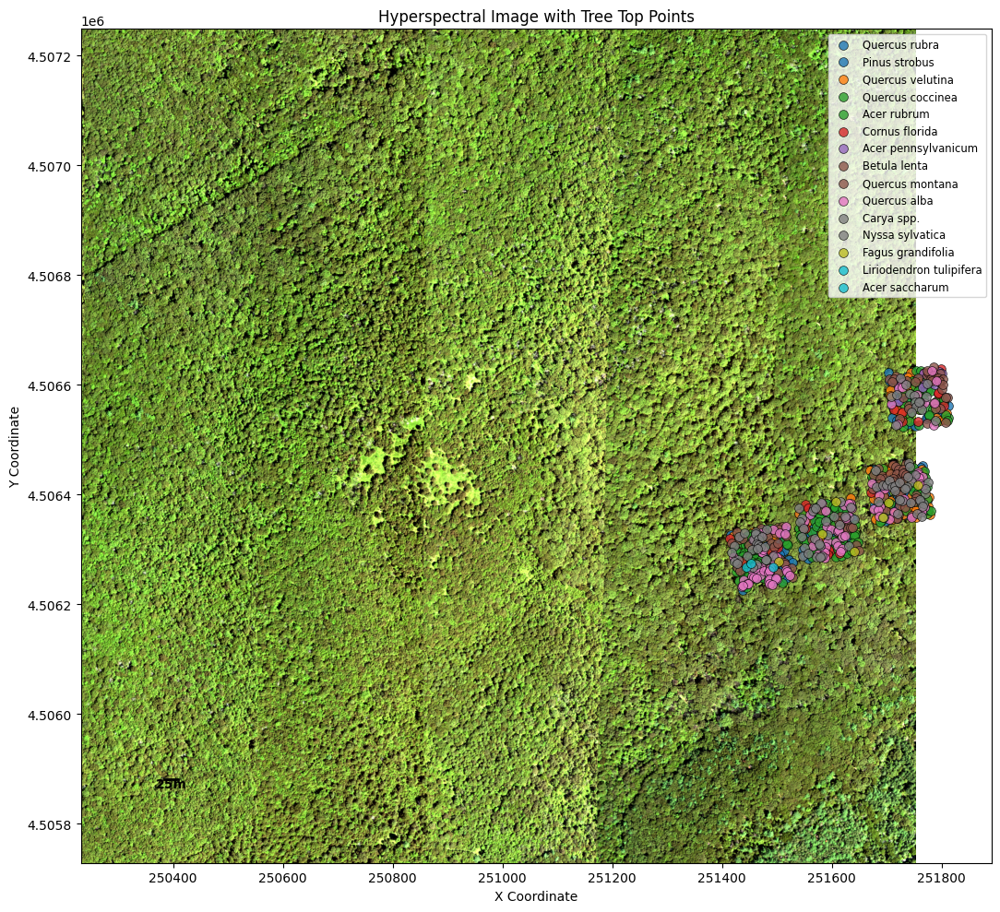

<Figure size 640x480 with 0 Axes>

In [ ]:
# 5. Create an RGB visualization of the HSI data
rgb_bands = [21, 13, 7]  # Approximately R, G, B bands

# Extract RGB bands
red_band = hsi32.values[rgb_bands[0], :, :]
green_band = hsi32.values[rgb_bands[1], :, :]
blue_band = hsi32.values[rgb_bands[2], :, :]

# Stack into an RGB image
rgb_image = np.stack([red_band, green_band, blue_band], axis=-1)

# Normalize to 0-255 for visualization
rgb_image = (rgb_image - np.percentile(rgb_image, 2)) / (np.percentile(rgb_image, 98) - np.percentile(rgb_image, 2))
rgb_image = np.clip(rgb_image * 255, 0, 255).astype(np.uint8)

# 5. Get coordinate information for plotting
bounds = hsi32.rio.bounds()
extent = [bounds[0], bounds[2], bounds[1], bounds[3]]  # [xmin, xmax, ymin, ymax]

# 6. Create a visualization with tree top points
plt.figure(figsize=(12, 10))

# Plot the HSI RGB image with correct georeferencing
plt.imshow(rgb_image, extent=extent)


# Create a color dictionary for different species
species_list = treetops['species'].unique()
colors = plt.cm.tab10(np.linspace(0, 1, len(species_list)))
species_colors = {species: colors[i] for i, species in enumerate(species_list)}

# Plot each tree top point with a different color by species
for species in species_list:
    species_points = treetops[treetops['species'] == species]
    plt.scatter(species_points['x'], species_points['y'],
                label=species,
                s=50,  # Size of dots
                c=[species_colors[species]],  # Color
                edgecolor='black',  # Black edge for visibility
                linewidth=0.5,
                alpha=0.8,
                marker='o')

# Add labels and title
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Hyperspectral Image with Tree Top Points')

# Add a legend with small font size
plt.legend(fontsize='small', loc='upper right')

# Create a scale bar (optional but helpful)
scale_length = 25  # meters
bar_x = bounds[0] + (bounds[2] - bounds[0]) * 0.1
bar_y = bounds[1] + (bounds[3] - bounds[1]) * 0.1
plt.plot([bar_x, bar_x + scale_length], [bar_y, bar_y], 'k-', linewidth=2)
plt.text(bar_x + scale_length/2, bar_y - (bounds[3] - bounds[1]) * 0.01,
         f'{scale_length}m', ha='center', color='k', fontweight='bold')

plt.tight_layout()
plt.show()

# 7. Save the figure if needed
plt.savefig('tree_tops_visualization.png', dpi=300, bbox_inches='tight')

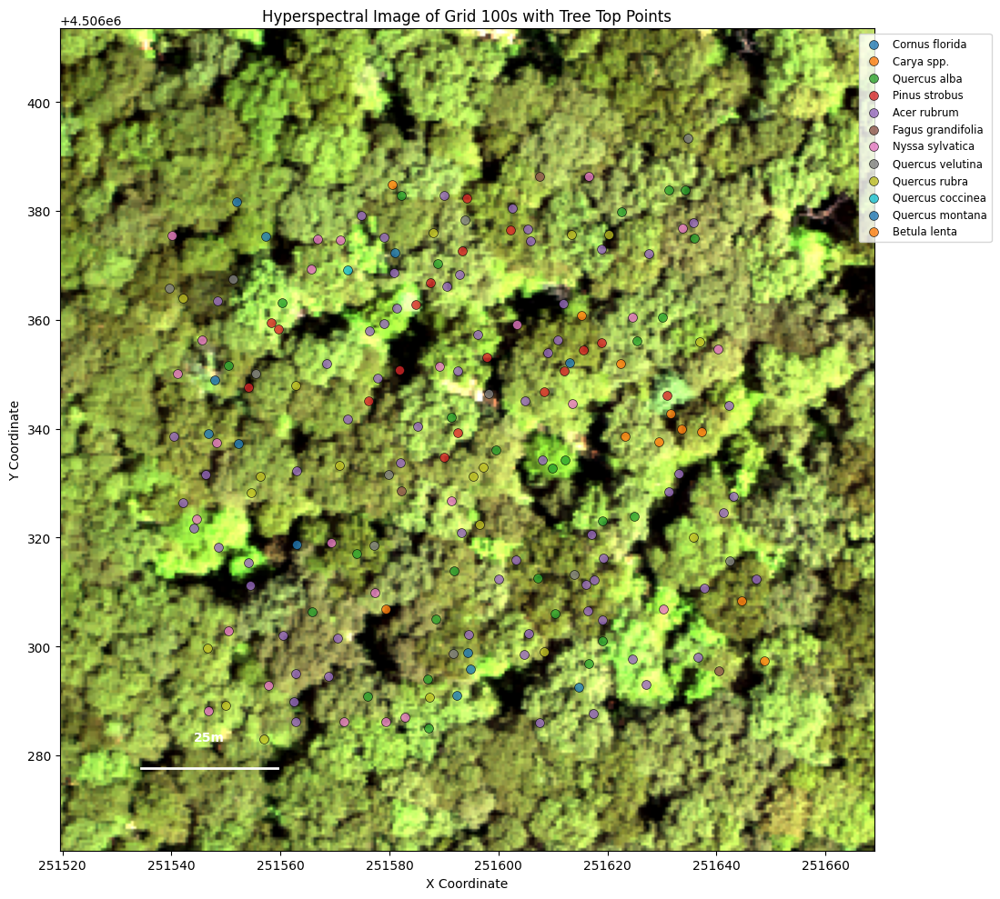

Tree counts by Grid ID:
    gridID  count
0    301.0     10
1    302.0     16
2    303.0     12
3    304.0      8
4    305.0     13
5    306.0     11
6    307.0     17
7    308.0     10
8    309.0     11
9    310.0     12
10   311.0     13
11   312.0     13
12   313.0     10
13   314.0     11
14   315.0     14
15   316.0     11

Species distribution:
species
Acer rubrum          66
Quercus alba         27
Nyssa sylvatica      25
Pinus strobus        18
Quercus rubra        18
Quercus velutina     11
Betula lenta          9
Cornus florida        7
Quercus montana       5
Fagus grandifolia     3
Carya spp.            2
Quercus coccinea      1
Name: count, dtype: int64


In [ ]:
import rioxarray as rxr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
from pyproj import Transformer

# 1. Load your HSI data
hsi32 = rxr.open_rasterio("Tile_32")

# 2. Load the ground truth data
trees_gdf = gpd.read_file("Lidar_feature_mcdill.geojson")

# 3. Filter trees with gridID in the 100s (100-199)
filtered_trees_gdf = trees_gdf[trees_gdf['gridID'].between(300, 399)]

# 4. Get the coordinate systems
source_crs = filtered_trees_gdf.crs  # Wisconsin Transverse Mercator (EPSG:6564)
target_crs = hsi32.rio.crs  # NAD_1983_2011_UTM_Zone_18N

# 5. Create a transformer to convert coordinates
transformer = Transformer.from_crs(source_crs, target_crs, always_xy=True)

# 6. Transform the tree coordinates
transformed_coords = []
for index, row in filtered_trees_gdf.iterrows():
    # Use ttop_x and ttop_y for treetop locations
    x, y = transformer.transform(row['ttop_x'], row['ttop_y'])
    transformed_coords.append({
        'species': row['scintfc'],
        'treeID': row['treeID_tto'],
        'gridID': row['gridID'],
        'x': x,
        'y': y
    })
treetops = pd.DataFrame(transformed_coords)

# 7. Get the min/max coordinates from filtered trees to crop the HSI
if len(treetops) > 0:
    x_min, x_max = treetops['x'].min(), treetops['x'].max()
    y_min, y_max = treetops['y'].min(), treetops['y'].max()

    # Add a small buffer around the area (e.g., 20 meters)
    buffer = 20
    x_min -= buffer
    x_max += buffer
    y_min -= buffer
    y_max += buffer

    # Crop the hyperspectral image to these bounds
    hsi32_cropped = hsi32.rio.clip_box(
        minx=x_min,
        miny=y_min,
        maxx=x_max,
        maxy=y_max
    )
else:
    print("No trees with gridID in the 100s range found!")
    hsi32_cropped = hsi32  # Use the original if no trees match

# 8. Create an RGB visualization of the cropped HSI data
rgb_bands = [21, 13, 7]  # Approximately R, G, B bands

# Extract RGB bands
red_band = hsi32_cropped.values[rgb_bands[0], :, :]
green_band = hsi32_cropped.values[rgb_bands[1], :, :]
blue_band = hsi32_cropped.values[rgb_bands[2], :, :]

# Stack into an RGB image
rgb_image = np.stack([red_band, green_band, blue_band], axis=-1)

# Normalize to 0-255 for visualization
rgb_image = (rgb_image - np.percentile(rgb_image, 2)) / (np.percentile(rgb_image, 98) - np.percentile(rgb_image, 2))
rgb_image = np.clip(rgb_image * 255, 0, 255).astype(np.uint8)

# 9. Get coordinate information for plotting
bounds = hsi32_cropped.rio.bounds()
extent = [bounds[0], bounds[2], bounds[1], bounds[3]]  # [xmin, xmax, ymin, ymax]

# 10. Create a visualization with tree top points
plt.figure(figsize=(12, 10))

# Plot the HSI RGB image with correct georeferencing
plt.imshow(rgb_image, extent=extent)

# Create a color dictionary for different species
species_list = treetops['species'].unique()
colors = plt.cm.tab10(np.linspace(0, 1, len(species_list)))
species_colors = {species: colors[i] for i, species in enumerate(species_list)}

# Plot each tree top point with a different color by species
for species in species_list:
    species_points = treetops[treetops['species'] == species]
    plt.scatter(species_points['x'], species_points['y'],
                label=species,
                s=50,  # Size of dots
                edgecolor='black',  # Black edge for visibility
                linewidth=0.5,
                alpha=0.8,
                marker='o')

# Add labels and title
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Hyperspectral Image of Grid 100s with Tree Top Points')

# Add a legend with small font size
plt.legend(fontsize='small', loc='upper right', bbox_to_anchor=(1.15, 1))

# Add a scale bar
scale_length = 25  # meters
bar_x = bounds[0] + (bounds[2] - bounds[0]) * 0.1
bar_y = bounds[1] + (bounds[3] - bounds[1]) * 0.1
plt.plot([bar_x, bar_x + scale_length], [bar_y, bar_y], 'w-', linewidth=2)
plt.text(bar_x + scale_length/2, bar_y + 5,
         f'{scale_length}m', ha='center', color='white', fontweight='bold')


plt.tight_layout()
plt.show()

# Optional: Add count of trees by grid ID
grid_counts = treetops.groupby('gridID').size().reset_index(name='count')
print("Tree counts by Grid ID:")
print(grid_counts)

# Optional: Print summary of species in the filtered dataset
species_counts = treetops['species'].value_counts()
print("\nSpecies distribution:")
print(species_counts)

In [ ]:
import geopandas as gpd
from pyproj import Transformer

# Assuming filtered_trees_gdf is your GeoDataFrame with Grid ID 1xx trees
# First, make sure we know the exact CRS of your data
source_crs = filtered_trees_gdf.crs  # This should print the EPSG code or proj string

# Create a transformer to convert from your projection to WGS84 (lat/lon)
transformer = Transformer.from_crs(source_crs, "EPSG:4326", always_xy=True)

# Choose a representative point (e.g., centroid of all your filtered trees)
mean_x = filtered_trees_gdf['ttop_x'].mean()
mean_y = filtered_trees_gdf['ttop_y'].mean()

# Transform to latitude/longitude
lon, lat = transformer.transform(mean_x, mean_y)

print(f"Google Maps coordinates: {lat}, {lon}")
print(f"Google Maps link: https://www.google.com/maps?q={lat},{lon}")

Google Maps coordinates: 40.67051917199036, -77.93887348794318
Google Maps link: https://www.google.com/maps?q=40.67051917199036,-77.93887348794318


In [ ]:
import geopandas as gpd
import numpy as np
from shapely.geometry import MultiPoint
from pyproj import Transformer

# Assuming filtered_trees_gdf is your filtered GeoDataFrame with gridID 100-199

# 1. Extract the minimum and maximum x,y coordinates to define the boundary
x_min = filtered_trees_gdf['ttop_x'].min()
x_max = filtered_trees_gdf['ttop_x'].max()
y_min = filtered_trees_gdf['ttop_y'].min()
y_max = filtered_trees_gdf['ttop_y'].max()

# 2. Create the four corner points of the bounding box
boundary_points = [
    (x_min, y_min),  # Bottom left
    (x_max, y_min),  # Bottom right
    (x_max, y_max),  # Top right
    (x_min, y_max),  # Top left
    (x_min, y_min)   # Close the polygon by repeating the first point
]

# 3. Print the boundary coordinates in the original projection
print("Boundary Points (original projection):")
for i, (x, y) in enumerate(boundary_points):
    print(f"Point {i+1}: {x}, {y}")

# 4. Transform to WGS84 (latitude/longitude) for Google Maps
source_crs = filtered_trees_gdf.crs
transformer = Transformer.from_crs(source_crs, "EPSG:4326", always_xy=True)

boundary_latlon = []
print("\nBoundary Points (latitude/longitude for Google Maps):")
for i, (x, y) in enumerate(boundary_points):
    lon, lat = transformer.transform(x, y)
    boundary_latlon.append((lat, lon))
    print(f"Point {i+1}: {lat}, {lon}")

# 5. Calculate the center point for a Google Maps link
center_lat = np.mean([p[0] for p in boundary_latlon[:-1]])  # Exclude the last point which is a duplicate
center_lon = np.mean([p[1] for p in boundary_latlon[:-1]])
print(f"\nCenter point: {center_lat}, {center_lon}")
print(f"Google Maps link: https://www.google.com/maps?q={center_lat},{center_lon}")

# 6. Create a polygon KML string that can be pasted into Google Maps or Google Earth
kml_coordinates = ' '.join([f"{lon},{lat},0" for lat, lon in boundary_latlon])
kml_string = f'''<?xml version="1.0" encoding="UTF-8"?>
<kml xmlns="http://www.opengis.net/kml/2.2">
  <Document>
    <Placemark>
      <name>Grid 100s Boundary</name>
      <Polygon>
        <outerBoundaryIs>
          <LinearRing>
            <coordinates>
              {kml_coordinates}
            </coordinates>
          </LinearRing>
        </outerBoundaryIs>
      </Polygon>
    </Placemark>
  </Document>
</kml>'''

print("\nKML String to paste into a .kml file for Google Earth:")
print(kml_string)

Boundary Points (original projection):
Point 1: 583976.55, 148438.37
Point 2: 584087.74, 148438.37
Point 3: 584087.74, 148551.12
Point 4: 583976.55, 148551.12
Point 5: 583976.55, 148438.37

Boundary Points (latitude/longitude for Google Maps):
Point 1: 40.670026846924955, -77.93951335244273
Point 2: 40.67002898826127, -77.93819828448693
Point 3: 40.67104435048758, -77.93820112636558
Point 4: 40.67104220911944, -77.93951621417939
Point 5: 40.670026846924955, -77.93951335244273

Center point: 40.670535598698315, -77.93885724436866
Google Maps link: https://www.google.com/maps?q=40.670535598698315,-77.93885724436866

KML String to paste into a .kml file for Google Earth:
<?xml version="1.0" encoding="UTF-8"?>
<kml xmlns="http://www.opengis.net/kml/2.2">
  <Document>
    <Placemark>
      <name>Grid 100s Boundary</name>
      <Polygon>
        <outerBoundaryIs>
          <LinearRing>
            <coordinates>
              -77.93951335244273,40.670026846924955,0 -77.93819828448693,40.67002

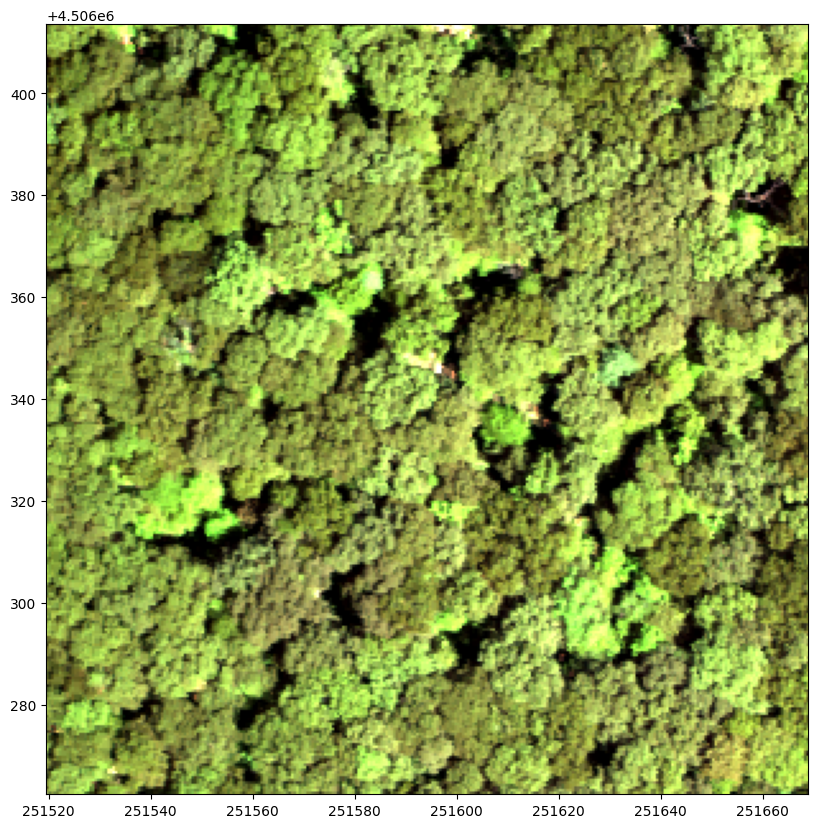

In [ ]:
# 10. Create a visualization with tree top points
plt.figure(figsize=(12, 10))

# Plot the HSI RGB image with correct georeferencing
plt.imshow(rgb_image, extent=extent)

Selected Bands (R, G, B): [20, 12, 6]


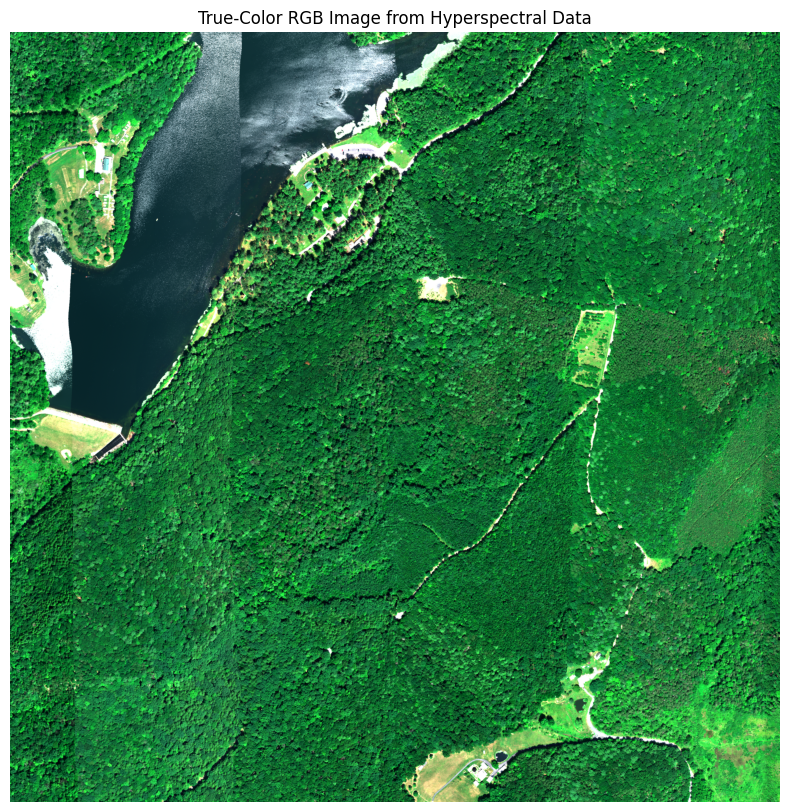

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Convert wavelength list to a NumPy array
wavelengths = np.array([float(w) for w in [
    '0.382', '0.397', '0.411', '0.425', '0.440', '0.454', '0.468', '0.483',
    '0.497', '0.511', '0.525', '0.540', '0.554', '0.568', '0.583', '0.597',
    '0.611', '0.625', '0.640', '0.654', '0.668', '0.683', '0.697', '0.711',
    '0.725', '0.740', '0.754', '0.768', '0.782', '0.797', '0.811', '0.825',
    '0.840', '0.854', '0.868', '0.882', '0.897', '0.911', '0.925', '0.939',
    '0.954', '0.968', '0.982', '0.997', '1.011', '1.025', '1.039', '1.054'
]])

# Define standard RGB wavelengths
rgb_wavelengths = [0.668, 0.554, 0.468]  # Red, Green, Blue in micrometers

# Find closest bands
rgb_bands = [np.abs(wavelengths - w).argmin() for w in rgb_wavelengths]
print(f"Selected Bands (R, G, B): {rgb_bands}")  # Should print [21, 13, 7]

# Extract RGB bands
red_band = hsi27.values[rgb_bands[0], :, :]
green_band = hsi27.values[rgb_bands[1], :, :]
blue_band = hsi27.values[rgb_bands[2], :, :]

# Stack into an RGB image
rgb_image = np.stack([red_band, green_band, blue_band], axis=-1)

# Normalize to 0-255
rgb_image = (rgb_image - np.percentile(rgb_image, 2)) / (np.percentile(rgb_image, 98) - np.percentile(rgb_image, 2))
rgb_image = np.clip(rgb_image * 255, 0, 255).astype(np.uint8)

# Plot
plt.figure(figsize=(10, 10))
plt.imshow(rgb_image)
plt.title("True-Color RGB Image from Hyperspectral Data")
plt.axis("off")
plt.show()


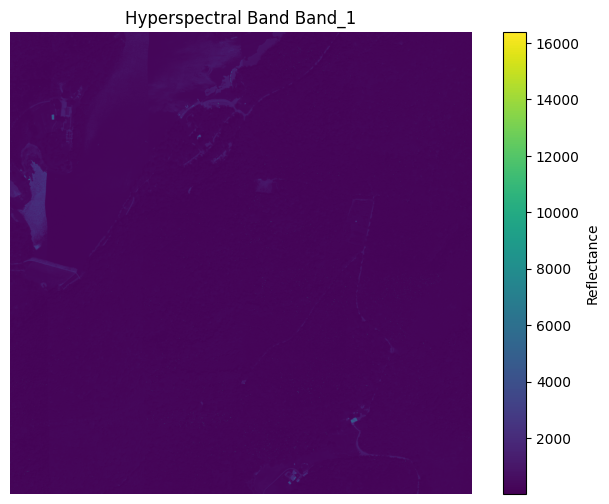

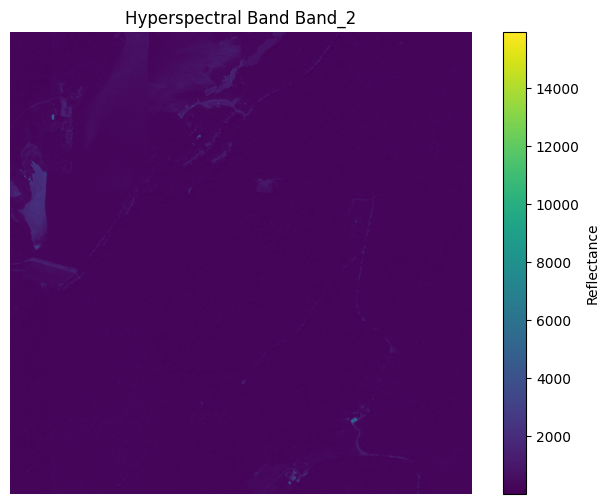

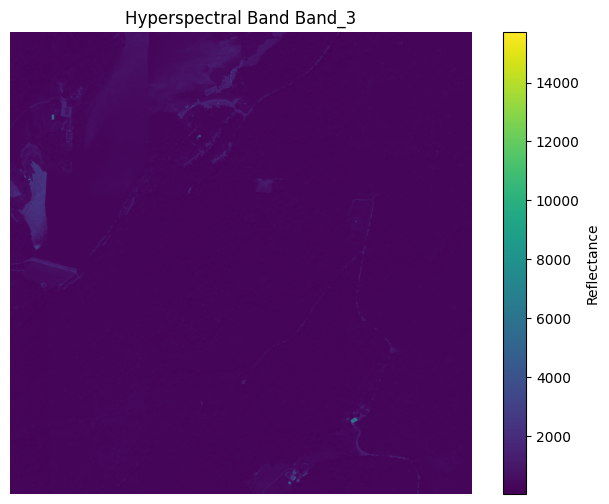

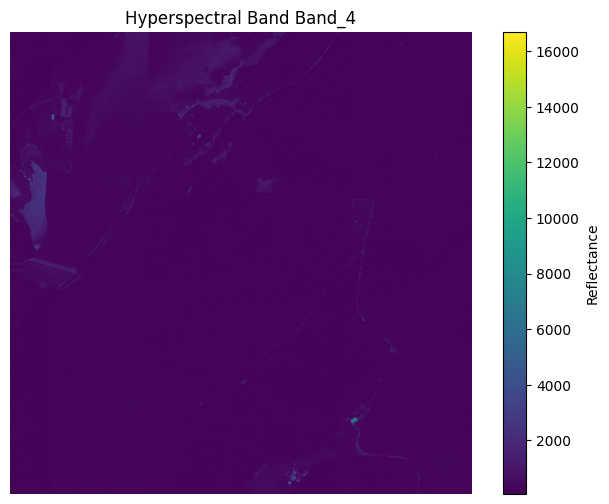

KeyboardInterrupt: 

In [ ]:
# Get the list of band indices
bands = hsi27.coords["band"].values

# Iterate through all bands and plot each one
for band in bands:
    plt.figure(figsize=(8, 6))
    plt.imshow(hsi27.sel(band=band), cmap="viridis")
    plt.colorbar(label="Reflectance")
    plt.title(f"Hyperspectral Band {band}")
    plt.axis("off")
    plt.show()


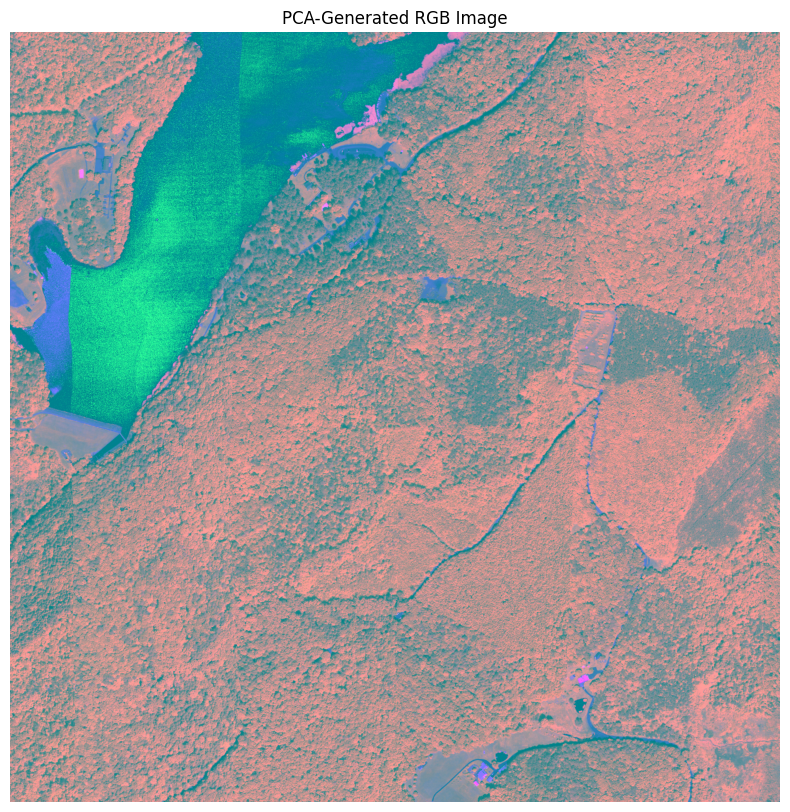

In [ ]:
# import numpy as np
# import xarray as xr
# from sklearn.decomposition import PCA
# import matplotlib.pyplot as plt

# # Convert Xarray DataArray to NumPy array (Bands, Height, Width) → (Height, Width, Bands)
# hsi_array = np.moveaxis(hsi27.values, 0, -1)  # Shape: (3040, 3040, 48)

# # Reshape for PCA: (Height * Width, Bands)
# H, W, C = hsi_array.shape
# reshaped_data = hsi_array.reshape(-1, C)

# # Apply PCA to reduce from 48 bands → 3 bands
# pca = PCA(n_components=3)
# pca_result = pca.fit_transform(reshaped_data)

# # Reshape back to (Height, Width, 3)
# rgb_image = pca_result.reshape(H, W, 3)

# # Normalize PCA results to [0, 255]
# rgb_image = (rgb_image - np.percentile(rgb_image, 2)) / (np.percentile(rgb_image, 98) - np.percentile(rgb_image, 2))
# rgb_image = np.clip(rgb_image * 255, 0, 255).astype(np.uint8)


# # Plot the converted RGB image
# plt.figure(figsize=(10, 10))
# plt.imshow(rgb_image)
# plt.title("PCA-Generated RGB Image")
# plt.axis("off")
# plt.show()


In [ ]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -O sam_vit_h.pth


--2025-03-08 23:28:50--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 108.157.254.15, 108.157.254.121, 108.157.254.124, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|108.157.254.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h.pth’

sam_vit_h.pth       100%[===================>]   2.39G  63.7MB/s    in 39s     

2025-03-08 23:29:29 (63.1 MB/s) - ‘sam_vit_h.pth’ saved [2564550879/2564550879]



In [ ]:
!pip install segment-anything

Image shape: (3040, 3040, 3)


/usr/local/lib/python3.11/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


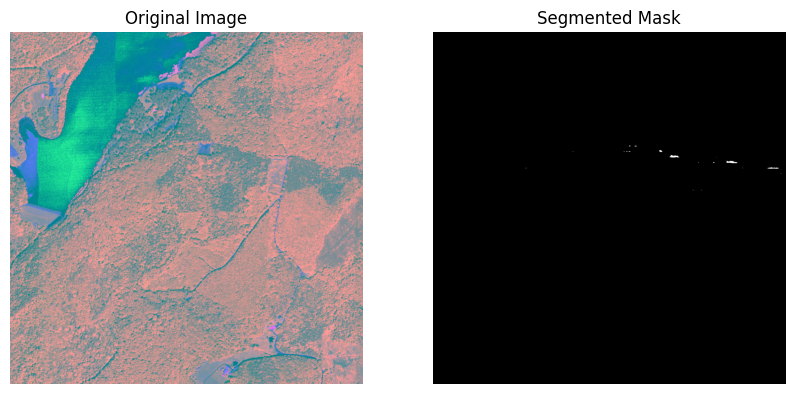

In [ ]:
import torch
import numpy as np
import tifffile
import cv2
import matplotlib.pyplot as plt
from segment_anything import SamPredictor, sam_model_registry
# from segment_anything import load_image

# Load your TIFF image
# image = tifffile.imread(list_of_image[0])  # Replace with the path to your TIFF file
image=rgb_image

# Check the shape of the image (it should be in [height, width, channels] format)
print(f"Image shape: {image.shape}")

# Normalize the image if needed (SAM model expects inputs in a certain format, so let's ensure it's in RGB)
#image_rgb = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)  # If your image is grayscale, convert it to RGB

# Load the SAM model (using the pre-trained weights from Meta)
checkpoint_path = "sam_vit_h.pth"  # Update with your checkpoint path
sam = sam_model_registry["vit_h"](checkpoint=checkpoint_path)
sam_predictor = SamPredictor(sam)

# Load the image into the SAM model
sam_predictor.set_image(image)

# Perform segmentation
# You will need to select points or use a specific method to guide the segmentation
# In this case, we're using a simple random point selection as an example
# Modify this based on your segmentation task (e.g., selecting multiple points manually)
# Example: single point (you can adjust this)

# Segment the image based on the point
masks, scores, logits = sam_predictor.predict()

# Visualize the results
# We will display the original image and the segmentation mask
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Segmentation mask
plt.subplot(1, 2, 2)
plt.imshow(masks[0], cmap='gray')
plt.title('Segmented Mask')
plt.axis('off')

plt.show()


In [ ]:
from segment_anything import SamAutomaticMaskGenerator
from tqdm import tqdm

# Initialize automatic mask generator
mask_generator = SamAutomaticMaskGenerator(sam)

# Generate masks with progress tracking
print("Generating segmentation masks...")

masks = []
for mask in tqdm(mask_generator.generate(image), desc="Processing", unit="mask"):
    masks.append(mask)

# Display the number of detected masks
print(f"Number of segmented objects: {len(masks)}")


Generating segmentation masks...


In [ ]:
len(masks)

NameError: name 'masks' is not defined

In [ ]:


for i in range(0, 40):
  # Select first mask from SAM output
  first_mask = masks[i]["segmentation"]

  # Display the mask
  plt.figure(figsize=(10, 10))
  plt.imshow(first_mask, cmap="gray")
  plt.axis("off")
  plt.title("Segmented Forest Mask")
  plt.show()


NameError: name 'masks' is not defined

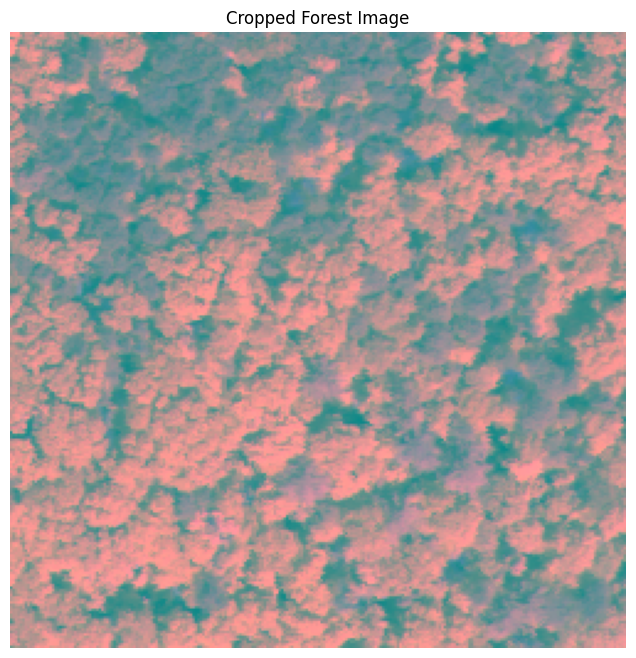

In [ ]:
# Define crop coordinates: [y_min:y_max, x_min:x_max]
x_min, x_max = 1250, 1500  # Horizontal range
y_min, y_max = 1250, 1500  # Vertical range

# Crop the image
cropped_image = image[y_min:y_max, x_min:x_max]

# Display the cropped image
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 8))
plt.imshow(cropped_image)
plt.title("Cropped Forest Image")
plt.axis("off")
plt.show()


In [ ]:
from segment_anything import SamAutomaticMaskGenerator
from tqdm import tqdm

# Initialize automatic mask generator
mask_generator = SamAutomaticMaskGenerator(sam)

# Generate masks with progress tracking
print("Generating segmentation masks...")

masks = []
for mask in tqdm(mask_generator.generate(cropped_image), desc="Processing", unit="mask"):
    masks.append(mask)

# Display the number of detected masks
print(f"Number of segmented objects: {len(masks)}")


Generating segmentation masks...


Processing: 100%|██████████| 116/116 [00:00<00:00, 950272.00mask/s]

Number of segmented objects: 116


TypeError: Invalid shape (0, 250, 5066) for image data

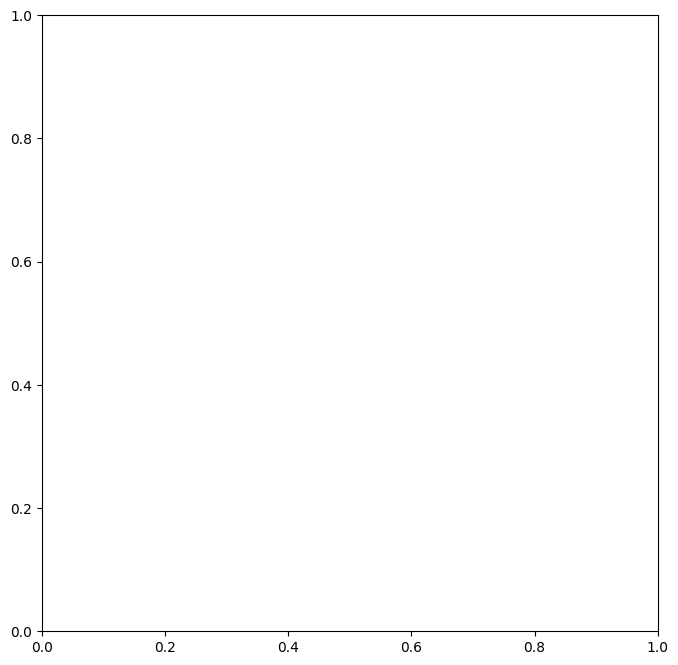

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from segment_anything import SamAutomaticMaskGenerator
from tqdm import tqdm

# Load TIFF image
tiff_path = "MS_rgb_tile_32.tif"
with rasterio.open(tiff_path) as src:
    image = src.read()  # Convert from (bands, height, width) to (height, width, bands)

# Define crop coordinates: [y_min:y_max, x_min:x_max]
x_min, x_max = 1250, 1500  # Horizontal range
y_min, y_max = 1250, 1500  # Vertical range

# Crop the image
cropped_image = image[y_min:y_max, x_min:x_max]

# Display the cropped image
plt.figure(figsize=(8, 8))
plt.imshow(cropped_image)
plt.title("Cropped Forest Image")
plt.axis("off")
plt.show()


In [ ]:
masks[0]["segmentation"].shape

(250, 250)

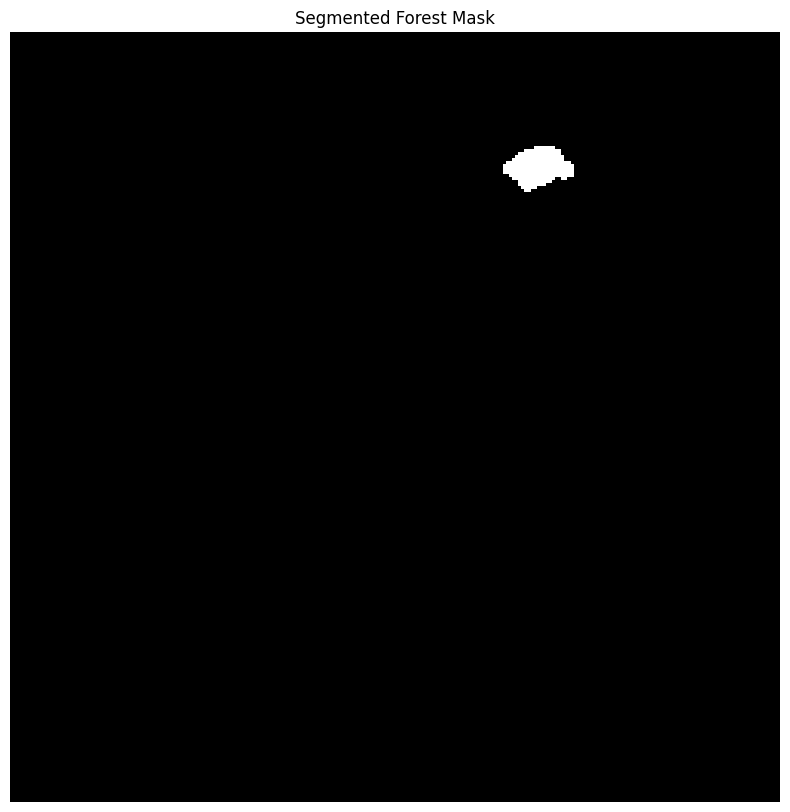

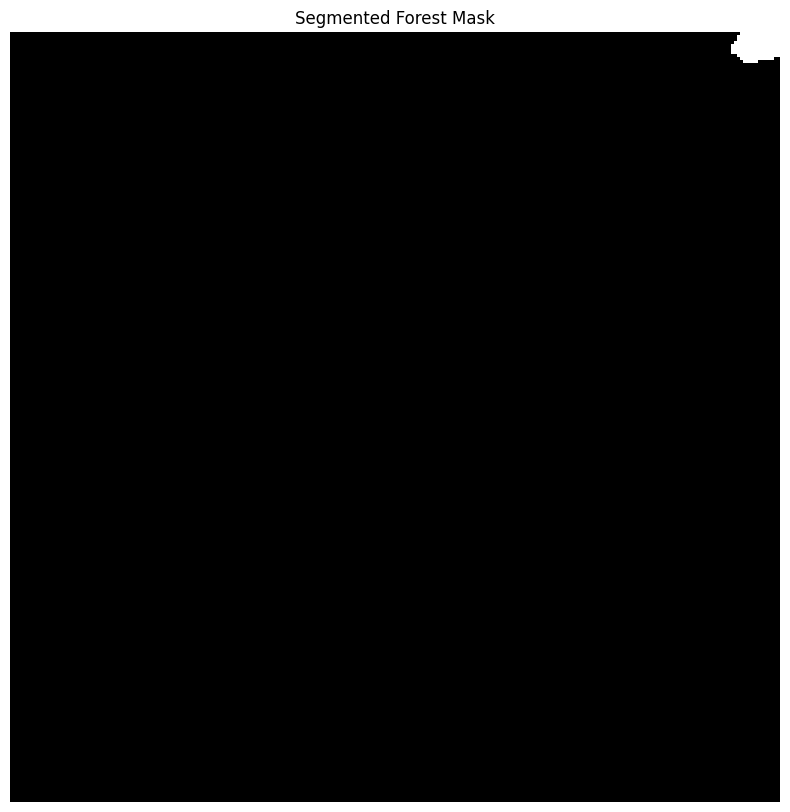

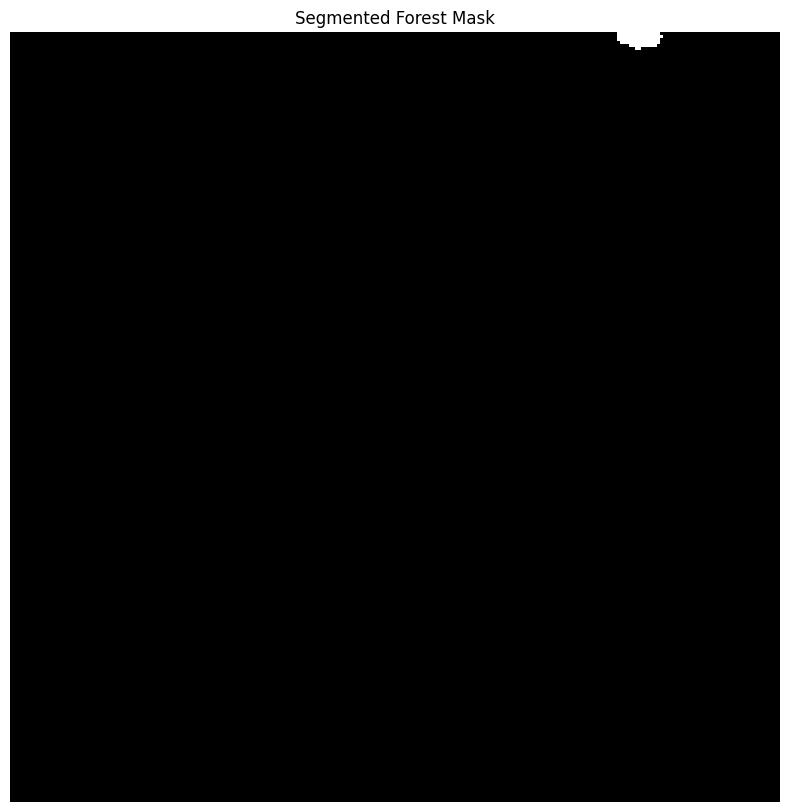

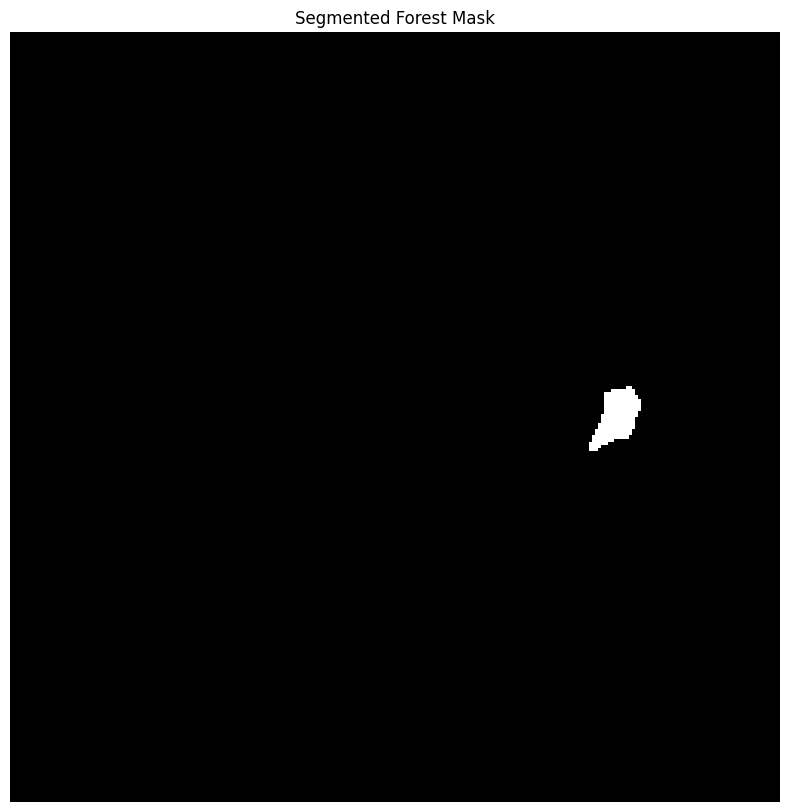

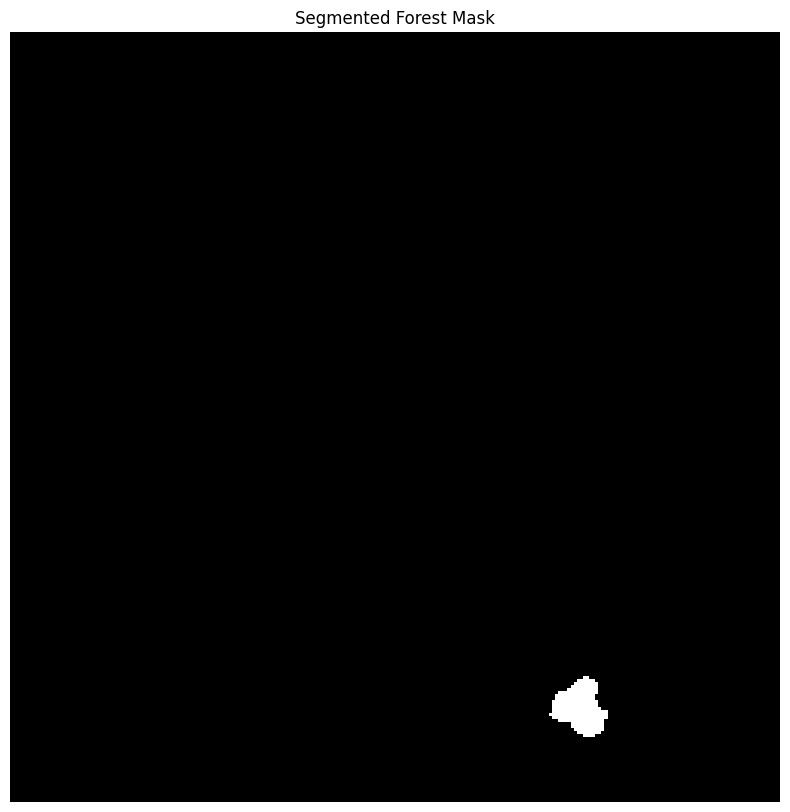

...

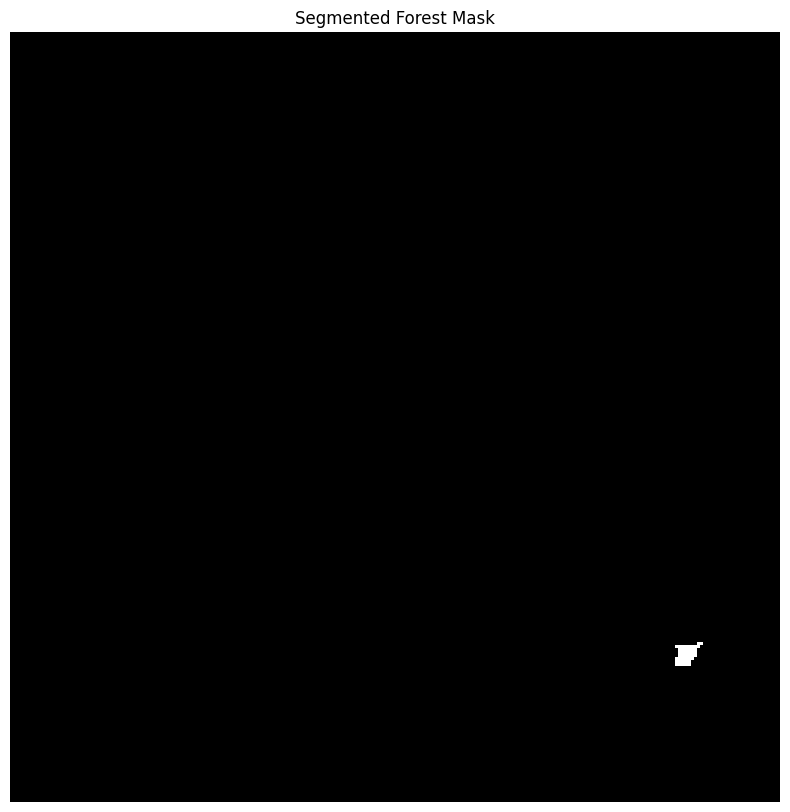

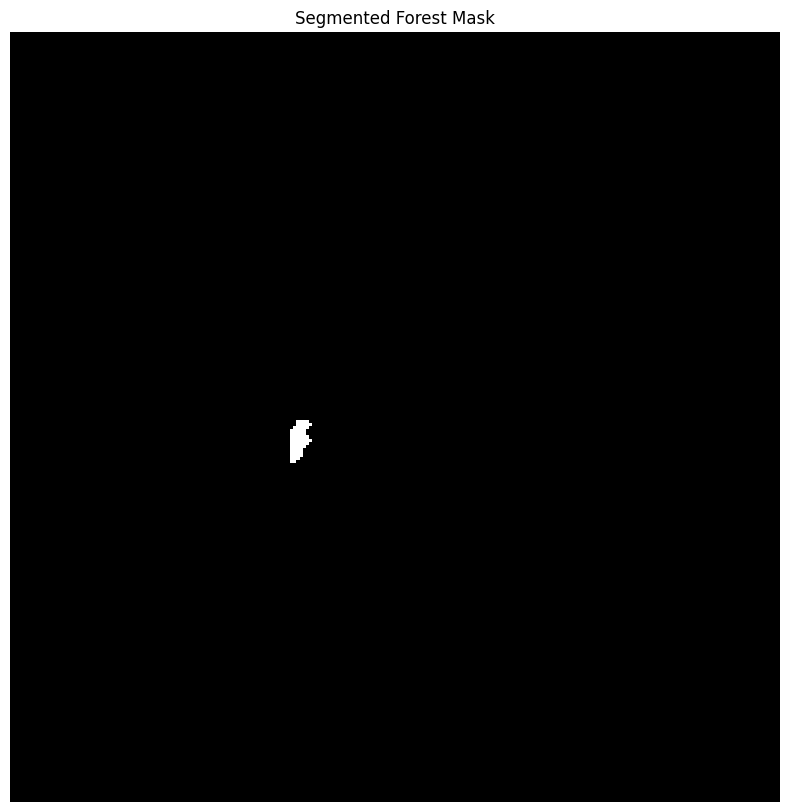

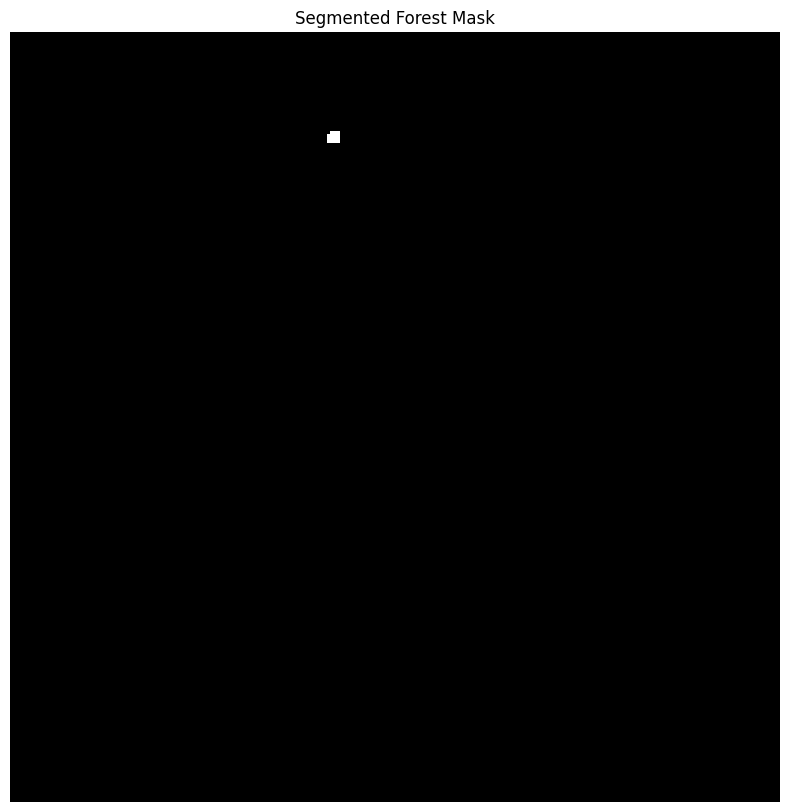

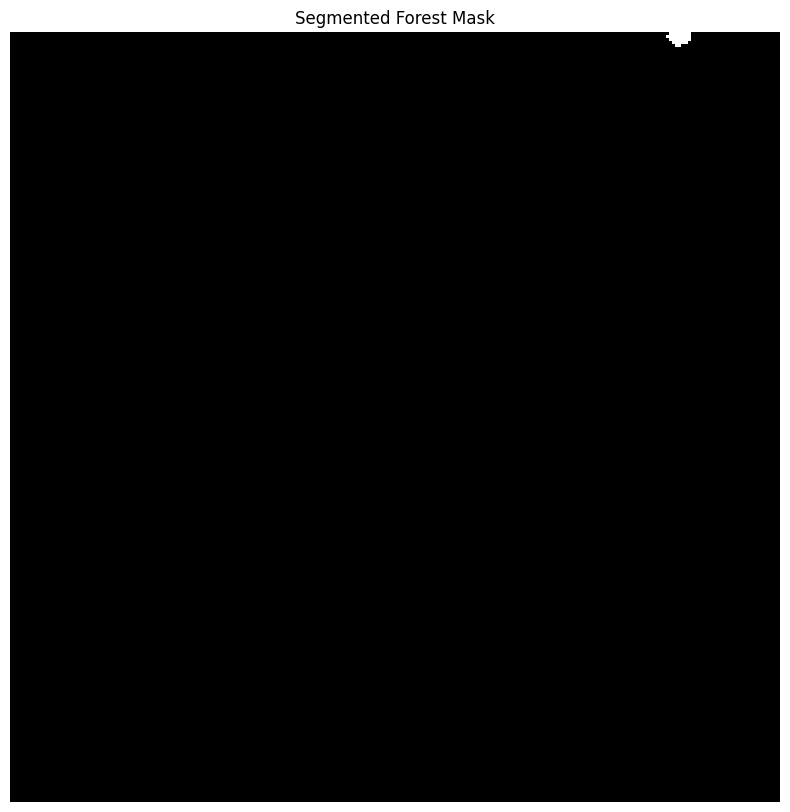

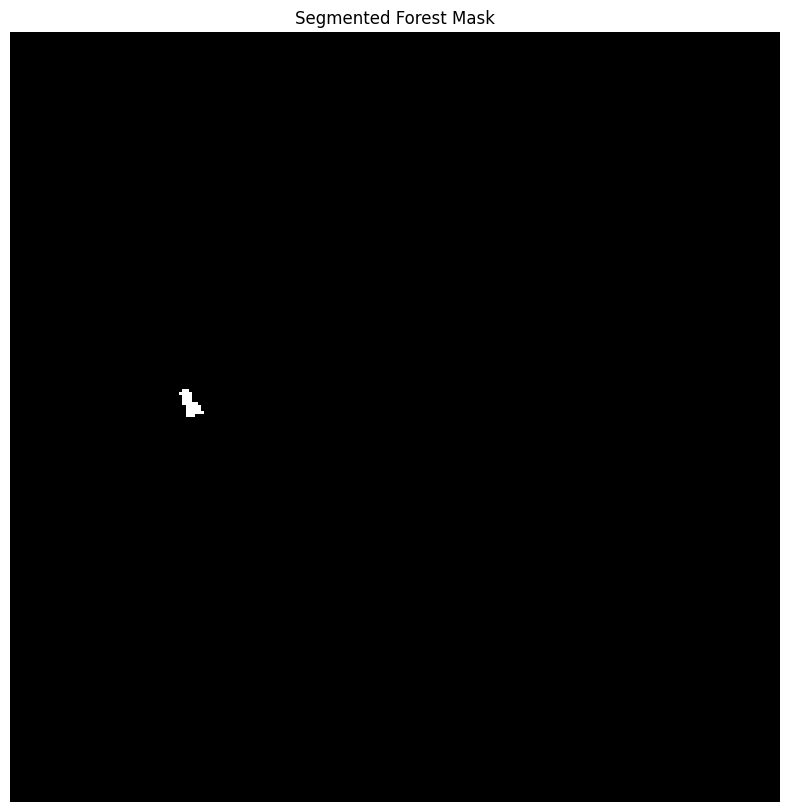

In [ ]:


for i in range(1, 115):
  # Select first mask from SAM output
  first_mask = masks[i]["segmentation"]

  # Display the mask
  plt.figure(figsize=(10, 10))
  plt.imshow(first_mask, cmap="gray")
  plt.axis("off")
  plt.title("Segmented Forest Mask")
  plt.show()


# jit


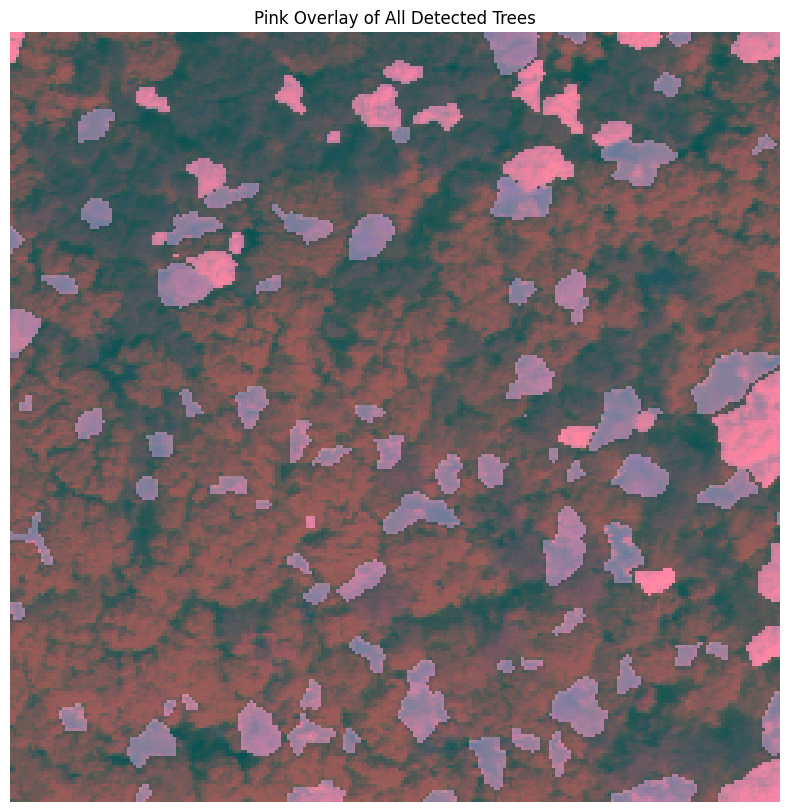

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure
plt.figure(figsize=(10, 10))
plt.imshow(cropped_image)  # Show original aerial image

# Create an empty mask (same size as the image)
combined_mask = np.zeros_like(cropped_image[:, :, 0], dtype=np.uint8)

# Overlay all 36 masks into a single combined mask
for mask in masks[1:]:
    combined_mask[mask["segmentation"]] = 1  # Set detected tree areas to 1

# Define pink color (R=255, G=105, B=180) for overlay
pink_overlay = np.zeros((*combined_mask.shape, 3), dtype=np.uint8)
pink_overlay[combined_mask == 1] = [255, 105, 180]  # Set tree areas to pink

# Overlay the pink mask on the original image with transparency
plt.imshow(pink_overlay, alpha=0.4)  # Adjust alpha for transparency

plt.axis("off")
plt.title("Pink Overlay of All Detected Trees")
plt.show()


In [ ]:
import pandas as pd

# Option 1: If working with a DataFrame
def extract_coordinates_from_dataframe(df):
    # Extract the x and y columns and create a list of tuples
    coordinates = list(zip(df['x'], df['y']))
    return coordinates

extract_coordinates_from_dataframe(treetops)


[(251551.91027596185, 4506381.721223586),
 (251580.55087753246, 4506384.767767342),
 (251582.16372356206, 4506382.8956503915),
 (251594.21722503938, 4506382.348021402),
 (251590.00796993225, 4506382.810133853),
 (251607.49403787617, 4506386.346126765),
 (251616.6019176836, 4506386.341142976),
 (251602.4847459078, 4506380.437650819),
 (251634.8190865492, 4506393.407373629),
 (251622.57309846953, 4506379.818554422),
 (251634.27037643988, 4506383.876134456),
 (251631.3272192017, 4506383.85820797),
 (251540.06410912136, 4506375.46636075),
 (251539.59288631406, 4506365.852618569),
 (251542.08470803735, 4506363.922948031),
 (251557.26465074654, 4506375.318037238),
 (251548.4240706185, 4506363.404136418),
 (251551.231570517, 4506367.399818832),
 (251560.32667134915, 4506363.151490508),
 (251566.87713902857, 4506374.806818254),
 (251565.6637615136, 4506369.2999237),
 (251545.6804219184, 4506356.333741951),
 (251559.69202794973, 4506358.227001553),
 (251558.31848904028, 4506359.431041166),
 (25

/usr/local/lib/python3.11/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


<Figure size 1200x1000 with 0 Axes>

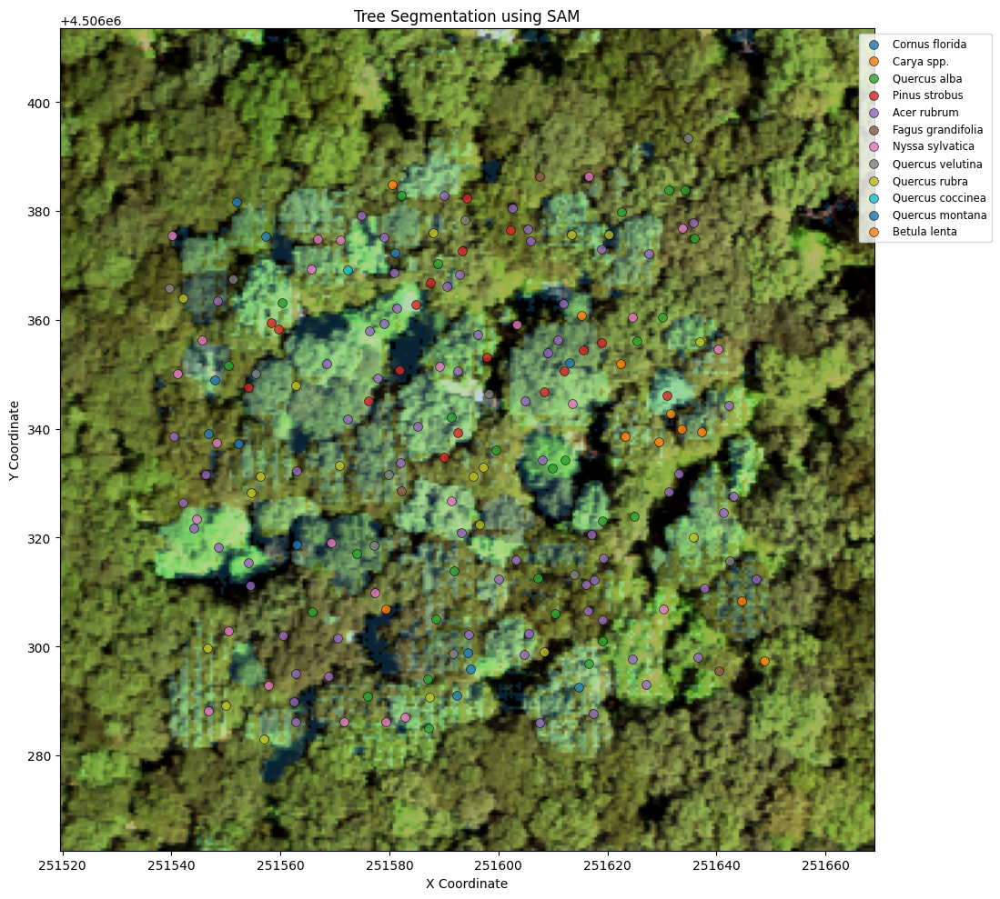

In [ ]:
import rioxarray as rxr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
from pyproj import Transformer
import torch
from segment_anything import sam_model_registry, SamPredictor

# 1. Load your HSI data
hsi32 = rxr.open_rasterio("Tile_32")

# 2. Load the ground truth data
trees_gdf = gpd.read_file("Lidar_feature_mcdill.geojson")

# 3. Filter trees with gridID in the 100s (100-199)
filtered_trees_gdf = trees_gdf[trees_gdf['gridID'].between(300, 399)]

# 4. Get the coordinate systems
source_crs = filtered_trees_gdf.crs  # Wisconsin Transverse Mercator (EPSG:6564)
target_crs = hsi32.rio.crs  # NAD_1983_2011_UTM_Zone_18N

# 5. Create a transformer to convert coordinates
transformer = Transformer.from_crs(source_crs, target_crs, always_xy=True)

# 6. Transform the tree coordinates
transformed_coords = []
for index, row in filtered_trees_gdf.iterrows():
    # Use ttop_x and ttop_y for treetop locations
    x, y = transformer.transform(row['ttop_x'], row['ttop_y'])
    transformed_coords.append({
        'species': row['scintfc'],
        'treeID': row['treeID_tto'],
        'gridID': row['gridID'],
        'x': x,
        'y': y
    })
treetops = pd.DataFrame(transformed_coords)

# 7. Get the min/max coordinates from filtered trees to crop the HSI
if len(treetops) > 0:
    x_min, x_max = treetops['x'].min(), treetops['x'].max()
    y_min, y_max = treetops['y'].min(), treetops['y'].max()

    # Add a small buffer around the area (e.g., 20 meters)
    buffer = 20
    x_min -= buffer
    x_max += buffer
    y_min -= buffer
    y_max += buffer

    # Crop the hyperspectral image to these bounds
    hsi32_cropped = hsi32.rio.clip_box(
        minx=x_min,
        miny=y_min,
        maxx=x_max,
        maxy=y_max
    )
else:
    print("No trees with gridID in the 100s range found!")
    hsi32_cropped = hsi32  # Use the original if no trees match

# 8. Create an RGB visualization of the cropped HSI data
rgb_bands = [21, 13, 7]  # Approximately R, G, B bands

# Extract RGB bands
red_band = hsi32_cropped.values[rgb_bands[0], :, :]
green_band = hsi32_cropped.values[rgb_bands[1], :, :]
blue_band = hsi32_cropped.values[rgb_bands[2], :, :]

# Stack into an RGB image
rgb_image = np.stack([red_band, green_band, blue_band], axis=-1)

# Normalize to 0-255 for visualization
rgb_image = (rgb_image - np.percentile(rgb_image, 2)) / (np.percentile(rgb_image, 98) - np.percentile(rgb_image, 2))
rgb_image = np.clip(rgb_image * 255, 0, 255).astype(np.uint8)

# 9. Get coordinate information for plotting
bounds = hsi32_cropped.rio.bounds()
extent = [bounds[0], bounds[2], bounds[1], bounds[3]]  # [xmin, xmax, ymin, ymax]

# 10. Create a visualization with tree top points
plt.figure(figsize=(12, 10))

# After you have your treetops DataFrame and cropped HSI image:

# 11. Load the SAM model
sam_checkpoint = "sam_vit_h_4b8939.pth"  # Download this from Meta AI's GitHub repo
model_type = "vit_h"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device)
predictor = SamPredictor(sam)

# 12. Convert the RGB image to the format SAM expects (H,W,3) and uint8
image_for_sam = rgb_image  # This is already in the right format from your script

# 13. Set the image in the SAM predictor
predictor.set_image(image_for_sam)

# 14. Convert the geographic coordinates to pixel coordinates
def geo_to_pixel_coords(x, y, bounds, image_shape):
    """Convert geographic coordinates to pixel coordinates in the image"""
    xmin, ymin, xmax, ymax = bounds[0], bounds[1], bounds[2], bounds[3]
    img_height, img_width = image_shape[0], image_shape[1]

    # Calculate the pixel coordinates
    pixel_x = int((x - xmin) / (xmax - xmin) * img_width)
    # Note: Y is inverted in image coordinates
    pixel_y = int((ymax - y) / (ymax - ymin) * img_height)

    return pixel_x, pixel_y

# 15. Create input points for SAM from treetops
bounds = hsi32_cropped.rio.bounds()
image_shape = rgb_image.shape
input_points = []
input_labels = []  # 1 for positive points (foreground)

for idx, row in treetops.iterrows():
    pixel_x, pixel_y = geo_to_pixel_coords(row['x'], row['y'], bounds, image_shape)
    input_points.append([pixel_x, pixel_y])
    input_labels.append(1)  # All points as positive foreground points

# Convert to numpy arrays
input_points = np.array(input_points)
input_labels = np.array(input_labels)

# 16. Generate masks for all points
masks, scores, logits = predictor.predict(
    point_coords=input_points,
    point_labels=input_labels,
    multimask_output=False  # Set to True if you want multiple mask predictions per point
)

# 17. Visualize the results
plt.figure(figsize=(12, 10))

# Plot the HSI RGB image
plt.imshow(rgb_image, extent=extent)

# Plot the masks as overlay
for i, mask in enumerate(masks):
    # Display segmentation mask with color based on species (using same colors from before)
    species = treetops.iloc[i]['species']
    color = species_colors[species]

    # Create a masked overlay
    masked = np.zeros_like(rgb_image)
    masked_color = np.array(color[:3]) * 255  # Convert from 0-1 to 0-255
    for c in range(3):
        masked[:,:,c] = np.where(mask, masked_color[c], 0)

    # Add the mask with transparency
    plt.imshow(masked, extent=extent, alpha=0.3)

# Plot each tree top point
for species in species_list:
    species_points = treetops[treetops['species'] == species]
    plt.scatter(species_points['x'], species_points['y'],
                label=species, s=50, edgecolor='black', linewidth=0.5,
                alpha=0.8, marker='o')

plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Tree Segmentation using SAM')
plt.legend(fontsize='small', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.tight_layout()
plt.show()

# 18. Optional: Save the masks for further analysis
# np.save("tree_masks.npy", masks)

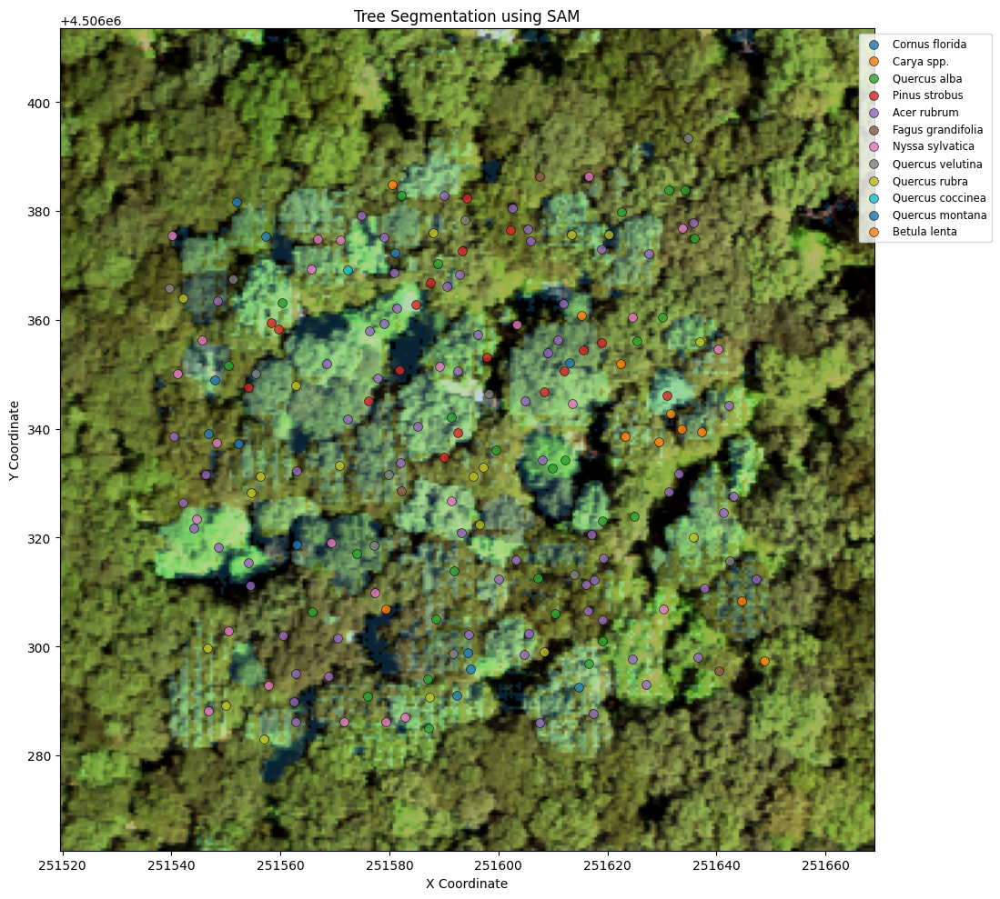

In [83]:
# 12. Convert the RGB image to the format SAM expects (H,W,3) and uint8
image_for_sam = rgb_image  # This is already in the right format from your script

# 13. Set the image in the SAM predictor
predictor.set_image(image_for_sam)

# 14. Convert the geographic coordinates to pixel coordinates
def geo_to_pixel_coords(x, y, bounds, image_shape):
    """Convert geographic coordinates to pixel coordinates in the image"""
    xmin, ymin, xmax, ymax = bounds[0], bounds[1], bounds[2], bounds[3]
    img_height, img_width = image_shape[0], image_shape[1]

    # Calculate the pixel coordinates
    pixel_x = int((x - xmin) / (xmax - xmin) * img_width)
    # Note: Y is inverted in image coordinates
    pixel_y = int((ymax - y) / (ymax - ymin) * img_height)

    return pixel_x, pixel_y

# 15. Create input points for SAM from treetops
bounds = hsi32_cropped.rio.bounds()
image_shape = rgb_image.shape
input_points = []
input_labels = []  # 1 for positive points (foreground)

for idx, row in treetops.iterrows():
    pixel_x, pixel_y = geo_to_pixel_coords(row['x'], row['y'], bounds, image_shape)
    input_points.append([pixel_x, pixel_y])
    input_labels.append(1)  # All points as positive foreground points

# Convert to numpy arrays
input_points = np.array(input_points)
input_labels = np.array(input_labels)

# 16. Generate masks for all points
masks, scores, logits = predictor.predict(
    point_coords=input_points,
    point_labels=input_labels,
    multimask_output=False  # Set to True if you want multiple mask predictions per point
)

# 17. Visualize the results
plt.figure(figsize=(12, 10))

# Plot the HSI RGB image
plt.imshow(rgb_image, extent=extent)

# Plot the masks as overlay
for i, mask in enumerate(masks):
    # Display segmentation mask with color based on species (using same colors from before)
    species = treetops.iloc[i]['species']
    color = species_colors[species]

    # Create a masked overlay
    masked = np.zeros_like(rgb_image)
    masked_color = np.array(color[:3]) * 255  # Convert from 0-1 to 0-255
    for c in range(3):
        masked[:,:,c] = np.where(mask, masked_color[c], 0)

    # Add the mask with transparency
    plt.imshow(masked, extent=extent, alpha=0.3)

# Plot each tree top point
for species in species_list:
    species_points = treetops[treetops['species'] == species]
    plt.scatter(species_points['x'], species_points['y'],
                label=species, s=50, edgecolor='black', linewidth=0.5,
                alpha=0.8, marker='o')

plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Tree Segmentation using SAM')
plt.legend(fontsize='small', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.tight_layout()
plt.show()

# 18. Optional: Save the masks for further analysis
# np.save("tree_masks.npy", masks)

In [ ]:
print(len(masks))

1


In [ ]:
# Create a figure
plt.figure(figsize=(10, 10))
plt.imshow(cropped_image)  # Original aerial image


# Overlay masks with random colors

for i, mask in enumerate(masks[:36]):
    mask_overlay = np.zeros_like(cropped_image, dtype=np.uint8)  # Create blank overlay
    mask_overlay[mask["segmentation"]] = (colors[i] * 255).astype(np.uint8)  # Assign color
    plt.imshow(mask_overlay, alpha=0.5)  # Adjust transparency

plt.axis("off")
plt.title("Colored Overlay of 36 Forest Segmentation Masks")
plt.show()


SyntaxError: invalid syntax (<ipython-input-28-d59376377948>, line 6)

## Preprocessing

In [ ]:
params = {'TARGET_DIR' : '/storage/group/tvq5043/default/deepLearning_Code/R/NewTrainingData/HSI/5m_patches',
    'PATTERN' : r'5m',
    'HEIGTH' : 10,
    'WIDTH' : 10,
    'BANDS' : 48,
          #the size of the batch for the neural network
    'batch_size' : 5
    }
#path to the folder for create the augmented dataset
dest='./dataset'

In [ ]:
#name_dict allows species merging (Key:Value pair where key is Original Specie and pair the new specie)

name_dict = {
    "Carya ovata": "Carya ENA clade",
    "Carya glabra": "Carya ENA clade",
    "Carya cordiformis": "Carya ENA clade",
    "Carya spp.": "Carya ENA clade",
    "Carya tormentosa": "Carya ENA clade",
    'Quercus prinus': 'Quercus montana',
    'Acer saccharum': 'Acer Sect Rubra',
    'Acer rubrum': "Acer Sect Rubra",
    "Pinus virginiana": "Pinus virginiana",
    "Liriodendron tulipifera": "Liriodendron tulipifera",
    "Betula lenta": "Betula lenta",
    "Fagus grandifolia": "Fagus grandifolia",
    "Magnolia acuminata": "Magnolia acuminata",
    "Nyssa sylvatica": "Nyssa sylvatica",
    "Pinus pungens": "Pinus pungens",
    "Pinus strobus": "Pinus strobus",
    "Quercus alba": "Quercus alba",
    "Quercus coccinea": "Quercus coccinea",
    "Quercus rubra": "Quercus rubra",
    "Quercus montana": "Quercus montana",
    "Quercus velutina": "Quercus velutina",
    "Fraxinus americana": "Fraxinus americana",
    "Prunus serotina": "Prunus serotina",
    "Tilia americana": "Tilia americana",
    "Tsuga canadensis": "Tsuga canadensis"
}
name_dict={'Quercus rubra':'Quercus','Quercus alba':'Quercus','Acer rubrum':'Acer',
           'Carya glabra':'Carya','Pinus strobus':'Pinus', 'Tsuga canadensis':'Tsuga',
           'Acer saccharum':'Acer','Quercus montana':'Quercus', 'Carya tormentosa': 'Carya',
           'Quercus velutina':'Quercus', 'Pinus virginiana':'Pinus', 'Carya ovata':'Carya',
            'Carya spp.':'Carya','Quercus velatina':'Quercus','Quercus coccinea':'Quercus',
           'Acer pennsylvanicum':'Acer', 'Pinus pungens':'Pinus'}

list_of_tree = list(set(name_dict.values()))

In [ ]:
# Search in the target directory and all subdirectories for files that matches the pattern

#create a list of tree with all the paths to the images
# Extracting unique values from name_dict
unique_values = set(name_dict.values())

# Creating a new dictionary tree_counts with keys from the unique values and initializing counts to 0
tree_counts = {value: 0 for value in unique_values}
tree_counts[None] = 0

for dir_, _, filenames in os.walk(params['TARGET_DIR']):
    for filename in filenames:
        name=filename.split('/')[-1].split('_')[0]
        name =name_dict.get(name)
        tree_counts[name] = tree_counts[name] + 1

In [ ]:
tree_counts

{'Carya': 291,
 'Pinus': 145,
 'Quercus': 1541,
 'Acer': 261,
 'Tsuga': 180,
 None: 70}

In [ ]:
list_of_image=[]

for dir_, _, filenames in os.walk(params['TARGET_DIR']):
    for filename in filenames:
        name=filename.split('/')[-1].split('_')[0]
        name =name_dict.get(name)

        if re.search(params['PATTERN'], filename) and name in list_of_tree:

            abspath = os.path.join(dir_, filename)
            list_of_image.append(abspath)
        else:
            pass

In [ ]:
import sys
print(sys.executable)

/storage/group/tvq5043/default/env/bin/python


In [ ]:
!pip uninstall segment-anything -y
!pip install --no-cache-dir git+https://github.com/facebookresearch/segment-anything.git


DEPRECATION: Loading egg at /storage/group/tvq5043/default/env/lib/python3.11/site-packages/segment_anything-1.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
Found existing installation: segment_anything 1.0
Uninstalling segment_anything-1.0:
ERROR: Exception:
Traceback (most recent call last):
  File "/storage/group/tvq5043/default/env/lib/python3.11/site-packages/pip/_internal/cli/base_command.py", line 180, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/storage/group/tvq5043/default/env/lib/python3.11/site-packages/pip/_internal/commands/uninstall.py", line 105, in run
    uninstall_pathset = req.uninstall(
                        ^^^^^^^^^^^^^^
  File "/storage/group/tvq5043/default/env/lib/python3.11/site-packages/pip/_internal/req/req_install.py", line 727, in uninstall
    uninstal

In [ ]:
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install torch torchvision torchaudio
!pip install opencv-python matplotlib


  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-tdq8erll
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-tdq8erll
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=4bd64060b9352d3050739d98d600b4b81d056706a108a99935db0236573bc8db
  Stored in directory: /tmp/pip-ephem-wheel-cache-7ohw5bwo/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment_anything
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 118.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip uninstall segment-anything -y
!pip install --no-cache-dir git+https://github.com/facebookresearch/segment-anything.git


Found existing installation: segment_anything 1.0
Uninstalling segment_anything-1.0:
  Successfully uninstalled segment_anything-1.0
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-wiwzaodo
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-wiwzaodo
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=29489ed55d1de0f24cd4fef439059fd3969ae10d2bcdbd123a3cc7fd248c9d29
  Stored in directory: /tmp/pip-ephem-wheel-cache-9kg307oe/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment_anything


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor


In [ ]:
from scipy.ndimage import rotate

arr = tifffile.imread(list_of_image[0])
rotated = rotate(arr, angle=5)
rotated

array([[[   0.     ,    0.     ,    0.     , ...,    0.     ,
            0.     ,    0.     ],
        [   0.     ,    0.     ,    0.     , ...,    0.     ,
            0.     ,    0.     ],
        [   0.     ,    0.     ,    0.     , ...,    0.     ,
            0.     ,    0.     ],
        ...,
        [   0.     ,    0.     ,    0.     , ...,    0.     ,
            0.     ,    0.     ],
        [   0.     ,    0.     ,    0.     , ...,    0.     ,
            0.     ,    0.     ],
        [   0.     ,    0.     ,    0.     , ...,    0.     ,
            0.     ,    0.     ]],

       [[   0.     ,    0.     ,    0.     , ...,    0.     ,
            0.     ,    0.     ],
        [ 270.15656,  286.99142,  338.90656, ..., 6762.908  ,
         6979.4375 , 7001.9404 ],
        [ 265.4719 ,  273.191  ,  295.67828, ..., 6169.513  ,
         6444.0005 , 6481.279  ],
        ...,
        [ 248.63354,  260.59344,  296.81943, ..., 6522.4214 ,
         6833.5767 , 6875.175  ],
        [ 32

In [ ]:
#  data augmentation (3 rotation, 1flip followed by 3rotation)
# dest folder to save images

Path(dest).mkdir(parents=True, exist_ok=True)

list_aug=[]
for im in list_of_image:
    arr = tifffile.imread(im)
    arr = np.rot90(arr, k=1, axes=(0, 1))
    name = im.split('/')[-1]+ '_' + 'rot90'
    tifffile.imwrite(os.path.join(dest,name), arr)
    list_aug.append(os.path.join(dest,name))

    arr = tifffile.imread(im)
    arr = np.rot90(arr, k=2, axes=(0, 1))
    name = im.split('/')[-1] +'_' + 'rot180'
    tifffile.imwrite(os.path.join(dest,name), arr)
    list_aug.append(os.path.join(dest,name))

    arr = tifffile.imread(im)
    arr = np.rot90(arr, k=3, axes=(0, 1))
    name = im.split('/')[-1] +'_' + 'rot270'
    tifffile.imwrite(os.path.join(dest,name), arr)
    list_aug.append(os.path.join(dest,name))

    arr = tifffile.imread(im)
    arr = np .flip (arr, axis=0)
    name = im.split('/')[-1]+ '_' + 'flip'
    tifffile.imwrite(os.path.join(dest,name), arr)
    list_aug.append(os.path.join(dest,name))

    arr = tifffile.imread(im)
    arr = np .flip (arr, axis=0)
    arr = np.rot90(arr, k=1, axes=(0, 1))
    name =  im.split('/')[-1]+ '_' + 'flip90'
    tifffile.imwrite(os.path.join(dest,name), arr)
    list_aug.append(os.path.join(dest,name))

    arr = tifffile.imread(im)
    arr = np .flip (arr, axis=0)
    arr = np.rot90(arr, k=2, axes=(0, 1))
    name = im.split('/')[-1] + '_' + 'flip180'
    tifffile.imwrite(os.path.join(dest,name), arr)
    list_aug.append(os.path.join(dest,name))

    arr = tifffile.imread(im)
    arr = np .flip (arr, axis=0)
    arr = np.rot90(arr, k=3, axes=(0, 1))
    name = im.split('/')[-1]+ '_' + 'flip270'
    tifffile.imwrite(os.path.join(dest,name), arr)
    list_aug.append(os.path.join(dest,name))

KeyboardInterrupt: 

In [ ]:
list_aug = list_of_image

In [ ]:
#list all tree species based on names, count the number of different species

tree_specie =set()

for im in list_of_image:
    specie = im.split('/')[-1].split('_')[0]
    specie =name_dict.get(specie)
    tree_specie.add(specie)

number_of_tree=len(tree_specie)

# assign a number to the different specie for the classification

dict_tree={}
for index,tree in enumerate(list(tree_counts)):
    if(tree != None):
        dict_tree[tree]=index

print(dict_tree)

{'Acer': 0, 'Carya': 1, 'Quercus': 2, 'Tsuga': 3, 'Pinus': 4}


In [ ]:
print(arr.shape)

(10, 10, 48)


In [ ]:
#Normalization create a numpy array and get some statistics
raw=[]
for im in list_of_image:
    arr = tifffile.imread(im)
    arr = arr [:,:,:]
    assert arr.shape == (params['HEIGTH'],params['WIDTH'],params['BANDS'])

    raw.append(arr)
image=np.ravel(raw).reshape(-1,params['HEIGTH'],params['WIDTH'],params['BANDS'])

mean, std = np.mean(image,axis=(0,1,2)), np.std(image,axis=(0,1,2))

data_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])


In [ ]:
# Create the datloader Subclass torch.utils.data.Dataset
class ImageFolderCustom(Dataset):

    # 2. Initialize with a targ_dir and transform (optional) parameter
    def __init__(self, targ_list , specie_dict ,  transform=None) -> None:

        # 3. Create class attributes
        self.targ_list = targ_list
        self.specie_dict = specie_dict

        self.transform = transform

    # 4. Make function to load images
    def load_image(self, index: int):
        "Opens an image via a path and returns it."
        image_path = self.targ_list[index]
        return tifffile.imread(image_path) [:,:,:]

    def get_label(self, index: int):

        name_dict = {
            "Carya ovata": "Carya ENA clade",
            "Carya glabra": "Carya ENA clade",
            "Carya cordiformis": "Carya ENA clade",
            "Carya spp.": "Carya ENA clade",
            "Carya tormentosa": "Carya ENA clade",
            'Quercus prinus': 'Quercus montana',
            'Acer saccharum': 'Acer Sect Rubra',
            'Acer rubrum': "Acer Sect Rubra",
            "Pinus virginiana": "Pinus virginiana",
            "Liriodendron tulipifera": "Liriodendron tulipifera",
            "Betula lenta": "Betula lenta",
            "Fagus grandifolia": "Fagus grandifolia",
            "Magnolia acuminata": "Magnolia acuminata",
            "Nyssa sylvatica": "Nyssa sylvatica",
            "Pinus pungens": "Pinus pungens",
            "Pinus strobus": "Pinus strobus",
            "Quercus alba": "Quercus alba",
            "Quercus coccinea": "Quercus coccinea",
            "Quercus rubra": "Quercus rubra",
            "Quercus montana": "Quercus montana",
            "Quercus velutina": "Quercus velutina",
            "Fraxinus americana": "Fraxinus americana",
            "Prunus serotina": "Prunus serotina",
            "Tilia americana": "Tilia americana",
            "Tsuga canadensis": "Tsuga canadensis"
        }
        name_dict={'Quercus rubra':'Quercus','Quercus alba':'Quercus','Acer rubrum':'Acer',
           'Carya glabra':'Carya','Pinus strobus':'Pinus', 'Tsuga canadensis':'Tsuga',
           'Acer saccharum':'Acer','Quercus montana':'Quercus', 'Carya tormentosa': 'Carya',
           'Quercus velutina':'Quercus', 'Pinus virginiana':'Pinus', 'Carya ovata':'Carya',
            'Carya spp.':'Carya','Quercus velatina':'Quercus','Quercus coccinea':'Quercus',
           'Acer pennsylvanicum':'Acer', 'Pinus pungens':'Pinus'}

        name = self.targ_list[index]
        specie = name.split('/')[-1].split('_')[0]
        specie = name_dict.get(specie)
 #       return self.one_hot[self.specie_dict[specie]]
        return self.specie_dict[specie]

    # 5. Overwrite the __len__() method (optional but recommended for subclasses of torch.utils.data.Dataset)
    def __len__(self) -> int:
        "Returns the total number of samples."
        return len(self.targ_list)

    # 6. Overwrite the __getitem__() method (required for subclasses of torch.utils.data.Dataset)
    def __getitem__(self, index: int):
        "Returns one sample of data, data and label (X, y)."
        img = self.load_image(index)
        class_idx = self.get_label(index)

        # Transform if necessary
        if self.transform:
            return self.transform(img), class_idx # return data, label (X, y)
        else:
            return img, class_idx # return data, label (X, y)

In [ ]:

# instantiate the dataloader with the images
list_final = list_aug
dataset=ImageFolderCustom(list_final,dict_tree,data_transforms)

# size of the validation dataset
TEST_SIZE = 0.1
SEED = 42

# generate list of labels for stratified train/test split
target_list=[]
for i in range(len(dataset)):
    target_list.append(dataset[i][1])




train_idx, validation_idx = train_test_split(np.arange(len(dataset)),
                                             test_size=TEST_SIZE,
                                             random_state=SEED,
                                             shuffle=True,
                                             stratify=target_list)

# Subset dataset for train and val
train_dataset = Subset(dataset, train_idx)
validation_dataset = Subset(dataset, validation_idx)

# Dataloader for train and val
train_loader = DataLoader(train_dataset, batch_size=params['batch_size'], shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=params['batch_size'], shuffle=False)



In [ ]:
print(dict_tree)

{'Prunus serotina': 0, 'Pinus pungens': 1, 'Quercus velutina': 2, 'Betula lenta': 3, 'Magnolia acuminata': 4, 'Fraxinus americana': 5, 'Quercus montana': 6, 'Tilia americana': 7, 'Liriodendron tulipifera': 8, 'Fagus grandifolia': 9, 'Nyssa sylvatica': 10, 'Carya ENA clade': 11, 'Acer Sect Rubra': 12, 'Quercus coccinea': 13, 'Quercus alba': 14, 'Pinus virginiana': 15, 'Pinus strobus': 16, 'Quercus rubra': 17, 'Tsuga canadensis': 18, None: 19}


In [ ]:
print(validation_dataset)

## Model

In [ ]:
# definition of the model
    #nn.MaxPool3d(3, stride=1),

# Adjusted 3D CNN Architecture
m = nn.Sequential(
    # Block 1
    nn.Conv3d(1, 16, kernel_size=3, stride=1, padding=1),  # Increased filters
    nn.BatchNorm3d(16),
    nn.ReLU(),
    nn.MaxPool3d(kernel_size=2, stride=2, padding=0),  # Ensure dimensions remain positive

    # Block 2
    nn.Conv3d(16, 32, kernel_size=3, stride=1, padding=1),  # Deeper filters
    nn.BatchNorm3d(32),
    nn.ReLU(),
    nn.MaxPool3d(kernel_size=2, stride=2, padding=0),

    # Block 3
    nn.Conv3d(32, 64, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm3d(64),
    nn.ReLU(),
    nn.MaxPool3d(kernel_size=2, stride=1, padding=0),  # Adjust stride and kernel size to prevent collapse

    # Block 4 (optional for deeper network)
    nn.Conv3d(64, 128, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm3d(128),
    nn.ReLU(),
    nn.AdaptiveAvgPool3d((1, 1, 1)),  # Ensure a fixed output size

    # Flatten and Fully Connected Layers
    nn.Flatten(),
    nn.Linear(128, 64),  # Reduced dimension for better generalization
    nn.ReLU(),
    nn.Dropout(0.1),  # Regularization
    nn.Linear(64, 5)  # Output layer with 5 classes
)

# example for propagating a tensor through the network
input = torch.randn(5, 48, 10, 10)
input=torch.unsqueeze(input,1)

output = m(input)
output.shape

torch.Size([5, 5])

In [ ]:
# Vision Transformer Test
class PatchEmbedding3D(nn.Module):
    def __init__(self, in_channels, patch_size, embed_dim):
        super().__init__()
        self.patch_size = patch_size
        self.projection = nn.Conv3d(
            in_channels, embed_dim, kernel_size=patch_size, stride=patch_size
        )

    def forward(self, x):
        # Shape: [batch_size, embed_dim, depth//patch_size, height//patch_size, width//patch_size]
        x = self.projection(x)  # Project patches into embeddings
        x = x.flatten(2)        # Flatten spatial dimensions
        x = x.transpose(1, 2)   # Shape: [batch_size, num_patches, embed_dim]
        return x

class TransformerEncoderLayer(nn.Module):
    def __init__(self, embed_dim, num_heads, mlp_dim, dropout=0.1):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(embed_dim, num_heads, dropout=dropout)
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, mlp_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(mlp_dim, embed_dim),
            nn.Dropout(dropout),
        )
        self.norm1 = nn.LayerNorm(embed_dim)
        self.norm2 = nn.LayerNorm(embed_dim)

    def forward(self, x):
        # Self-attention block
        attn_out, _ = self.self_attn(x, x, x)  # Shape: [batch_size, num_patches, embed_dim]
        x = x + attn_out
        x = self.norm1(x)

        # Feed-forward block
        mlp_out = self.mlp(x)
        x = x + mlp_out
        x = self.norm2(x)
        return x

class VisionTransformer3D(nn.Module):
    def __init__(self, in_channels, num_classes, patch_size, embed_dim, depth, num_heads, mlp_dim, dropout=0.1):
        super().__init__()
        self.patch_embed = PatchEmbedding3D(in_channels, patch_size, embed_dim)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))  # Learnable [CLS] token
        self.positional_encoding = nn.Parameter(
            torch.zeros(1, 1 + (48 // patch_size) * (10 // patch_size) * (10 // patch_size), embed_dim)
        )
        self.encoder = nn.ModuleList(
            [TransformerEncoderLayer(embed_dim, num_heads, mlp_dim, dropout) for _ in range(depth)]
        )
        self.cls_head = nn.Sequential(
            nn.LayerNorm(embed_dim),
            nn.Linear(embed_dim, num_classes),
        )

    def forward(self, x):
        x = self.patch_embed(x)  # Patch embedding
        batch_size, num_patches, _ = x.shape

        # Add [CLS] token
        cls_tokens = self.cls_token.expand(batch_size, -1, -1)  # Shape: [batch_size, 1, embed_dim]
        x = torch.cat((cls_tokens, x), dim=1)  # Shape: [batch_size, 1 + num_patches, embed_dim]

        # Add positional encoding
        x = x + self.positional_encoding[:, : x.size(1), :]

        # Pass through transformer encoder
        for layer in self.encoder:
            x = layer(x)

        # Classification head
        cls_output = x[:, 0]  # Take [CLS] token
        out = self.cls_head(cls_output)
        return out

# Example Usage
m = VisionTransformer3D(
    in_channels=1,  # Single channel for grayscale
    num_classes=5,  # Number of classes
    patch_size=4,   # Divide 3D volume into (4x4x4) patches
    embed_dim=128,  # Embedding dimension for each patch
    depth=6,        # Number of transformer layers
    num_heads=8,    # Number of attention heads
    mlp_dim=256,    # Dimension of MLP hidden layer
    dropout=0.1     # Dropout for regularization
)

# Test input
input = torch.randn(5, 1, 48, 10, 10)  # Batch of 5, single channel, depth=48, height=10, width=10
output = m(input)
print(output.shape)  # Output: [5, 5]


torch.Size([5, 5])


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# possible changes: change # heads to 6, change depth to ~4$

class PatchEmbedding3D(nn.Module):
    def __init__(self, in_channels, embed_dim, patch_size=(2, 4, 4)):
        super().__init__()
        self.proj = nn.Conv3d(
            in_channels, embed_dim, kernel_size=patch_size, stride=patch_size
        )

    def forward(self, x):
        return self.proj(x)  # [batch_size, embed_dim, D_out, H_out, W_out]


class WindowAttention3D(nn.Module):
    def __init__(self, embed_dim, window_size, num_heads):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.window_size = window_size

        self.qkv = nn.Linear(embed_dim, embed_dim * 3, bias=True)
        self.softmax = nn.Softmax(dim=-1)
        self.proj = nn.Linear(embed_dim, embed_dim)

    def forward(self, x):
        B, D, H, W, C = x.shape
        x = x.view(B * D * H * W, C)  # Flatten spatial dimensions
        qkv = self.qkv(x).reshape(B * D * H * W, 3, self.num_heads, C // self.num_heads)
        q, k, v = qkv.permute(1, 2, 0, 3)

        attn = (q @ k.transpose(-2, -1)) / (C // self.num_heads) ** 0.5
        attn = self.softmax(attn)
        x = (attn @ v).transpose(1, 2).reshape(B, D, H, W, C)
        x = self.proj(x.view(B * D * H * W, C)).view(B, D, H, W, C)
        return x


class SwinBlock3D(nn.Module):
    def __init__(self, embed_dim, window_size, num_heads):
        super().__init__()
        self.attn = WindowAttention3D(embed_dim, window_size, num_heads)
        self.norm1 = nn.LayerNorm(embed_dim)
        self.norm2 = nn.LayerNorm(embed_dim)
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, embed_dim * 4),
            nn.GELU(),
            nn.Linear(embed_dim * 4, embed_dim),
        )

    def forward(self, x):
        shortcut = x
        x = self.norm1(x)
        x = self.attn(x)
        x = shortcut + x

        shortcut = x
        x = self.norm2(x)
        x = self.mlp(x)
        x = shortcut + x
        return x


class SwinTransformer3D(nn.Module):
    def __init__(self, in_channels, num_classes, embed_dim=96, window_size=(2, 7, 7), patch_size=(2, 4, 4), num_heads=4, depth=2):
        super().__init__()
        self.patch_embed = PatchEmbedding3D(in_channels, embed_dim, patch_size)
        self.layers = nn.ModuleList([
            SwinBlock3D(embed_dim, window_size, num_heads) for _ in range(depth)
        ])
        self.pool = nn.AdaptiveAvgPool3d(1)
        self.fc = nn.Linear(embed_dim, num_classes)

    def forward(self, x):
        x = self.patch_embed(x)  # [B, embed_dim, D, H, W]
        B, C, D, H, W = x.shape
        x = x.permute(0, 2, 3, 4, 1)  # [B, D, H, W, embed_dim]

        for layer in self.layers:
            x = layer(x)

        x = x.permute(0, 4, 1, 2, 3)  # [B, embed_dim, D, H, W]
        x = self.pool(x)
        x = x.view(B, -1)
        x = self.fc(x)
        return x


# Instantiate and test the model
m = SwinTransformer3D(
    in_channels=1,  # Single-channel input
    num_classes=19,  # Number of output classes
    embed_dim=96,   # Embedding dimension
    window_size=(2, 7, 7),
    patch_size=(2, 4, 4),
    num_heads=6,
    depth=4
)

# Test input
input_tensor = torch.randn(5, 1, 48, 10, 10)  # [batch_size, num_channels, depth, height, width]
output = model(input_tensor)
print(output.shape)  # Expected output: [5, num_classes]


torch.Size([5, 5])


In [ ]:
### TRAIN


In [ ]:
from torch import optim

tree_counts_w_none = tree_counts
print(tree_counts_w_none)
if None in tree_counts_w_none:
    del tree_counts_w_none[None]
counts = torch.tensor(list(tree_counts.values()), dtype=torch.float)
weights = 1.0 / counts
weights = weights / weights.sum()
criterion = nn.CrossEntropyLoss(label_smoothing=0.0)

optimizer = optim.Adam(m.parameters(), lr=0.001)
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.99)
m.to(device)
val_losses = []
train_losses = []
# train for a number of epochs
nbr_epochs=50

min_loss = 1e9
best_model = None

for epoch in range(nbr_epochs):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        labels.to(device)
        # zero the parameter gradients
        optimizer.zero_grad()
        inputs = torch.unsqueeze(inputs,1).to(device)
        # forward + backward + optimize
        outputs = m(inputs)
        loss = criterion(outputs, labels.to(device))
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    train_losses.append(running_loss/len(train_loader))
    running_loss = 0.0

    running_loss = 0.0
    for i, data in enumerate(validation_loader, 0):
         inputs, labels = data
         labels.to(device)
         inputs = torch.unsqueeze(inputs,1).to(device)
         outputs = m(inputs)
         loss = criterion(outputs, labels.to(device))
         running_loss += loss.item()
    val_losses.append(running_loss/len(validation_loader))

    print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss/len(validation_loader)}')
    running_loss = 0.0

print('Finished Training')


{'Acer': 261, 'Carya': 291, 'Quercus': 1541, 'Tsuga': 180, 'Pinus': 145}
[1,    49] loss: 2.054746339971922
[2,    49] loss: 2.155706912279129
[3,    49] loss: 1.984656780349965
[4,    49] loss: 2.049621581423039
[5,    49] loss: 2.137769881863983
[6,    49] loss: 2.337714568996916
[7,    49] loss: 2.2353282441594162
[8,    49] loss: 2.408742720831414
[9,    49] loss: 2.199501241652333
[10,    49] loss: 2.272562343551188
[11,    49] loss: 2.5294890263859107
[12,    49] loss: 2.4038289271447124
[13,    49] loss: 2.263067364996793
[14,    49] loss: 2.355647780153216
[15,    49] loss: 2.253967184801491
[16,    49] loss: 2.5468444617427126
[17,    49] loss: 2.447329346014529
[18,    49] loss: 2.3453998912353904
[19,    49] loss: 2.3965603459854514
[20,    49] loss: 2.3421315097687194


KeyboardInterrupt: 

In [ ]:
train_losses

[2.644242234629204,
 2.5614325266617994,
 2.4818789112082436,
 2.4696823579693272,
 2.4846007859005645,
 2.427402241737055,
 2.369813111033375,
 2.3504095651984755,
 2.32100316598944,
 2.2998316492969635,
 2.294408618325022,
 2.2374418584200053,
 2.242707247243208,
 2.1868366767648117,
 2.1818872574227965,
 2.155474936800305,
 2.114754297479785,
 2.0620986858374395,
 2.0347044939908505,
 2.0147933448871336,
 1.993186931264886,
 1.9476453756315137,
 1.8690308124770945,
 1.8765556055765886,
 1.8550751910490149]

In [ ]:
val_losses

[2.6407717275619507,
 2.5716794300079346,
 2.568521282672882,
 2.587528038024902,
 2.54837158203125,
 2.534316403865814,
 2.5591805839538573,
 2.51789865732193,
 2.565287890434265,
 2.6121756434440613,
 2.6263344955444334,
 2.6537154793739317,
 2.58477744102478,
 2.6416378307342527,
 2.618816834688187,
 2.4919930338859557,
 2.718249464035034,
 2.761266859769821,
 2.7808532691001893,
 2.6235219383239747,
 2.7377853095531464,
 2.9788904285430906,
 2.827467432022095,
 2.7778338992595675,
 2.904909106492996]

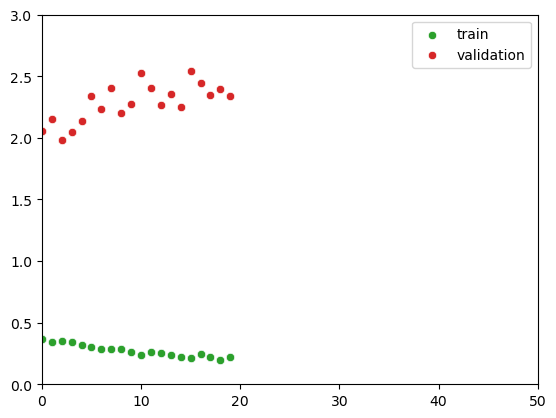

In [ ]:
#plot training and validation loss as training go (both should go down and then plateau)
import seaborn as sns
fig, ax = plt.subplots()
sns.scatterplot(train_losses)
sns.scatterplot(val_losses)
ax.set_ylim(0, 3
           )
ax.set_xlim(0, 50)
sns.scatterplot(train_losses, label= 'train')
sns.scatterplot(val_losses,label='validation')
ax.legend()

In [ ]:
#plot the confusion matrix calculation on the validation set

from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

y_pred = []
y_true = []

# iterate over test data
print(len(validation_loader))
for inputs, labels in validation_loader:
        inputs = torch.unsqueeze(inputs,1).to(device)
        output = m(inputs) # Feed Network

        output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
        #output=output.data.cpu().numpy()
        y_pred.extend(output) # Save Prediction

        labels = labels.data.cpu().numpy()
        y_true.extend(labels) # Save Truth

classes = list(dict_tree.keys())
if None in classes:
    classes.remove(None)
from sklearn.metrics import confusion_matrix
# Build confusion matrix
cf_matrix = confusion_matrix(labels.astype(int), output.astype(int))
cf_matrix = confusion_matrix(np.array(y_true),np.array( y_pred))


cm = pd.DataFrame(cf_matrix, index = [i for i in classes],columns = [i for i in classes])
plt.figure(figsize = (12,7))
sn.heatmap(cm, annot=True)
#plt.savefig('output.png')



50


ValueError: Shape of passed values is (15, 15), indices imply (19, 19)

In [ ]:
pri

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(np.array(y_true),np.array( y_pred), target_names=[i for i in classes], digits=3))

ValueError: Number of classes, 15, does not match size of target_names, 20. Try specifying the labels parameter

In [ ]:
print(m)

Sequential(
  (0): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (1): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (5): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (6): ReLU()
  (7): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (8): Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (9): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (10): ReLU()
  (11): MaxPool3d(kernel_size=2, stride=1, padding=0, dilation=1, ceil_mode=False)
  (12): Conv3d(64, 128, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (13): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (14): ReLU()
  (1